In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split

In [2]:
data = pd.read_csv('csv/image_bins_stats.csv')
data.shape

(24000, 98)

In [3]:
data.head()

,filename,rmean_bins0,rmean_bins1,rmean_bins2,rmean_bins3,rmean_bins4,rmean_bins5,rmean_bins6,rmean_bins7,rstd_bins0,...,bskew_bins7,bkurto_bins0,bkurto_bins1,bkurto_bins2,bkurto_bins3,bkurto_bins4,bkurto_bins5,bkurto_bins6,bkurto_bins7,class
0,clean_p_1.jpg,1.485688,116.416667,0.0,0.0,0.000000,128.758621,0.0,159.770015,11.472993,...,7.358843,47.621590,3.092351,0.0,0.0,0.000000,8.421707,0.0,9.181035,1
1,clean_p_2.jpg,0.191129,91.000000,0.0,0.0,0.000000,122.485714,0.0,149.839854,0.626280,...,8.430080,7.154429,0.840896,0.0,0.0,0.000000,15.029039,0.0,10.516990,1
2,clean_p_3.jpg,1.218065,115.000000,0.0,0.0,121.730769,135.517857,0.0,154.189458,10.132966,...,7.949709,43.394240,0.420448,0.0,0.0,7.701832,13.599319,0.0,10.354453,1
3,clean_p_4.jpg,0.148524,98.000000,0.0,0.0,0.000000,129.906667,0.0,157.583812,0.573290,...,8.987692,6.601182,2.619225,0.0,0.0,0.000000,12.787280,0.0,10.943418,1
4,clean_p_5.jpg,0.183128,0.000000,0.0,0.0,0.000000,0.000000,0.0,158.600042,0.602004,...,7.204324,6.869720,0.000000,0.0,0.0,0.000000,0.000000,0.0,8.924785,1


In [4]:
data = data.drop(['filename'], axis=1)

In [5]:
data.head()

,rmean_bins0,rmean_bins1,rmean_bins2,rmean_bins3,rmean_bins4,rmean_bins5,rmean_bins6,rmean_bins7,rstd_bins0,rstd_bins1,...,bskew_bins7,bkurto_bins0,bkurto_bins1,bkurto_bins2,bkurto_bins3,bkurto_bins4,bkurto_bins5,bkurto_bins6,bkurto_bins7,class
0,1.485688,116.416667,0.0,0.0,0.000000,128.758621,0.0,159.770015,11.472993,1.943118,...,7.358843,47.621590,3.092351,0.0,0.0,0.000000,8.421707,0.0,9.181035,1
1,0.191129,91.000000,0.0,0.0,0.000000,122.485714,0.0,149.839854,0.626280,0.000000,...,8.430080,7.154429,0.840896,0.0,0.0,0.000000,15.029039,0.0,10.516990,1
2,1.218065,115.000000,0.0,0.0,121.730769,135.517857,0.0,154.189458,10.132966,0.000000,...,7.949709,43.394240,0.420448,0.0,0.0,7.701832,13.599319,0.0,10.354453,1
3,0.148524,98.000000,0.0,0.0,0.000000,129.906667,0.0,157.583812,0.573290,2.000000,...,8.987692,6.601182,2.619225,0.0,0.0,0.000000,12.787280,0.0,10.943418,1
4,0.183128,0.000000,0.0,0.0,0.000000,0.000000,0.0,158.600042,0.602004,0.000000,...,7.204324,6.869720,0.000000,0.0,0.0,0.000000,0.000000,0.0,8.924785,1


In [6]:
import numpy as np
def clean_dataset(df):
    assert isinstance(df, pd.DataFrame), "df needs to be a pd.DataFrame"
    df.dropna(inplace=True)
    indices_to_keep = ~df.isin([np.nan, np.inf, -np.inf]).any(1)
    return df[indices_to_keep].astype(np.float64)

clean_dataset(data)

,rmean_bins0,rmean_bins1,rmean_bins2,rmean_bins3,rmean_bins4,rmean_bins5,rmean_bins6,rmean_bins7,rstd_bins0,rstd_bins1,...,bskew_bins7,bkurto_bins0,bkurto_bins1,bkurto_bins2,bkurto_bins3,bkurto_bins4,bkurto_bins5,bkurto_bins6,bkurto_bins7,class
0,1.485688,116.416667,0.0,0.0,0.000000,128.758621,0.000000,159.770015,11.472993,1.943118,...,7.358843,47.621590,3.092351,0.0,0.0,0.000000,8.421707,0.000000,9.181035,1.0
1,0.191129,91.000000,0.0,0.0,0.000000,122.485714,0.000000,149.839854,0.626280,0.000000,...,8.430080,7.154429,0.840896,0.0,0.0,0.000000,15.029039,0.000000,10.516990,1.0
2,1.218065,115.000000,0.0,0.0,121.730769,135.517857,0.000000,154.189458,10.132966,0.000000,...,7.949709,43.394240,0.420448,0.0,0.0,7.701832,13.599319,0.000000,10.354453,1.0
3,0.148524,98.000000,0.0,0.0,0.000000,129.906667,0.000000,157.583812,0.573290,2.000000,...,8.987692,6.601182,2.619225,0.0,0.0,0.000000,12.787280,0.000000,10.943418,1.0
4,0.183128,0.000000,0.0,0.0,0.000000,0.000000,0.000000,158.600042,0.602004,0.000000,...,7.204324,6.869720,0.000000,0.0,0.0,0.000000,0.000000,0.000000,8.924785,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23994,0.167535,0.000000,0.0,0.0,0.000000,0.000000,0.000000,145.580835,0.587364,0.000000,...,6.817875,7.277478,0.000000,0.0,0.0,0.000000,0.000000,0.000000,11.111529,0.0
23995,0.182460,0.000000,0.0,0.0,0.000000,0.000000,0.000000,142.290042,0.590877,0.000000,...,5.262551,8.170191,0.000000,0.0,0.0,0.000000,0.000000,0.000000,10.111068,0.0
23996,0.222222,0.000000,0.0,0.0,0.000000,0.000000,0.000000,145.978772,0.689536,0.000000,...,5.407731,7.859719,0.000000,0.0,0.0,0.000000,0.000000,0.000000,9.734824,0.0
23997,0.217425,0.000000,0.0,0.0,0.000000,0.000000,0.000000,145.915418,0.665380,0.000000,...,5.073114,7.887594,0.000000,0.0,0.0,0.000000,0.000000,0.000000,9.672132,0.0


In [7]:
# separate train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    data.drop(labels=['class'], axis=1),
    data['class'],
    test_size=0.3,
    random_state=0)

X_train.shape, X_test.shape

((16799, 96), (7200, 96))

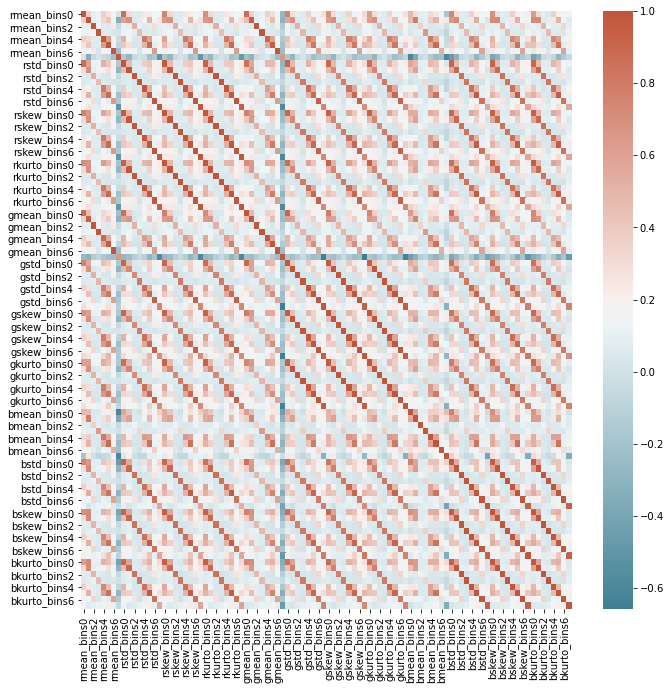

In [8]:
# visualise correlated features:

# I will build a correlation matrix, which examines the 
# correlation of all features (that is, for all possible feature combinations)
# and then visualise the correlation matrix using a heatmap

# the default correlation method of pandas.corr is pearson
# I include it anyways for the demo
corrmat = X_train.corr(method='pearson')

# we can make a heatmap with the package seaborn
# and customise the colours of searborn's heatmap
cmap = sns.diverging_palette(220, 20, as_cmap=True)

# some more parameters for the figure
fig, ax = plt.subplots()
fig.set_size_inches(11,11)

# and now plot the correlation matrix
sns.heatmap(corrmat, cmap=cmap)

In the plot above, the dark orange squares correspond to highly correlated features (>0.8). Darker blue squares corresponds to negatively correlated features (<-0.8).

The diagonal represents the correlation of a feature with itself, therefore the value is 1.

We can see that there are a few features that are highly correlated.

First, we can observe that:
1. There is very high correlation with the moment degree of n and the corresponding moment degree of n+1 of the same bins value.
2. Kurtosis and skewness are values that are typically stronger among these values

In [9]:
# build a dataframe with the correlation between features
# remember that the absolute value of the correlation
# coefficient is important and not the sign

corrmat = X_train.corr()
corrmat = corrmat.abs().unstack() # absolute value of corr coef
corrmat = corrmat.sort_values(ascending=False)
corrmat = corrmat[corrmat >= 0.8]
corrmat = corrmat[corrmat < 1]
corrmat = pd.DataFrame(corrmat).reset_index()
corrmat.columns = ['feature1', 'feature2', 'corr']
corrmat.head()

,feature1,feature2,corr
0,rskew_bins3,rkurto_bins3,0.999641
1,rkurto_bins3,rskew_bins3,0.999641
2,rskew_bins4,rkurto_bins4,0.999470
3,rkurto_bins4,rskew_bins4,0.999470
4,rkurto_bins2,rskew_bins2,0.999460


In [10]:
# find groups of correlated features

grouped_feature_ls = []
correlated_groups = []

for feature in corrmat.feature1.unique():
    
    if feature not in grouped_feature_ls:

        # find all features correlated to a single feature
        correlated_block = corrmat[corrmat.feature1 == feature]
        grouped_feature_ls = grouped_feature_ls + list(
            correlated_block.feature2.unique()) + [feature]

        # append the block of features to the list
        correlated_groups.append(correlated_block)

print('found {} correlated groups'.format(len(correlated_groups)))
print('out of {} total features'.format(X_train.shape[1]))

found 21 correlated groups
out of 96 total features


In [11]:
# now we can print out each group. We see that some groups contain
# only 2 correlated features, some other groups present several features 
# that are correlated among themselves.

for group in correlated_groups:
    print(group)
    print()

        feature1      feature2      corr
0    rskew_bins3  rkurto_bins3  0.999641
15   rskew_bins3    rstd_bins3  0.999271
426  rskew_bins3   bskew_bins3  0.838694
429  rskew_bins3    bstd_bins3  0.838481
441  rskew_bins3  bkurto_bins3  0.829427
497  rskew_bins3    gstd_bins3  0.801997

        feature1      feature2      corr
2    rskew_bins4  rkurto_bins4  0.999470
27   rskew_bins4    rstd_bins4  0.998989
320  rskew_bins4    gstd_bins4  0.866748
331  rskew_bins4  gkurto_bins4  0.864690
333  rskew_bins4   gskew_bins4  0.864497
349  rskew_bins4  bkurto_bins4  0.859824
354  rskew_bins4   bskew_bins4  0.858729
368  rskew_bins4    bstd_bins4  0.856214
469  rskew_bins4   rmean_bins4  0.809383

         feature1      feature2      corr
4    rkurto_bins2   rskew_bins2  0.999460
86   rkurto_bins2    rstd_bins2  0.996647
358  rkurto_bins2    bstd_bins2  0.858356
377  rkurto_bins2  bkurto_bins2  0.854159
384  rkurto_bins2   bskew_bins2  0.852439

        feature1      feature2      corr
6    gs

In [12]:
# we can now investigate further features within one group.
# let's for example select group 0

group = correlated_groups[0]
group

,feature1,feature2,corr
0,rskew_bins3,rkurto_bins3,0.999641
15,rskew_bins3,rstd_bins3,0.999271
426,rskew_bins3,bskew_bins3,0.838694
429,rskew_bins3,bstd_bins3,0.838481
441,rskew_bins3,bkurto_bins3,0.829427
497,rskew_bins3,gstd_bins3,0.801997


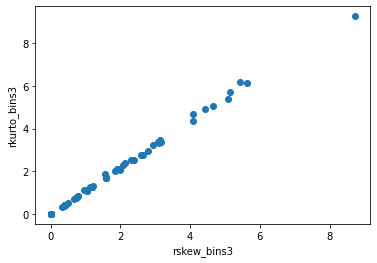

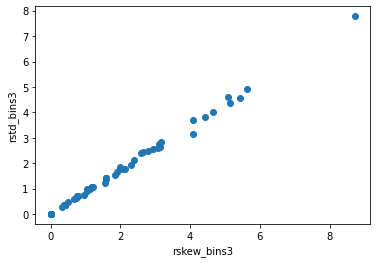

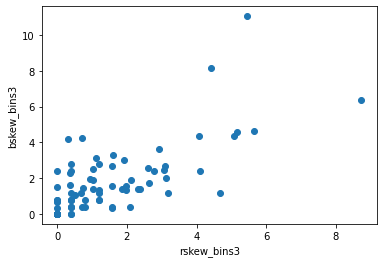

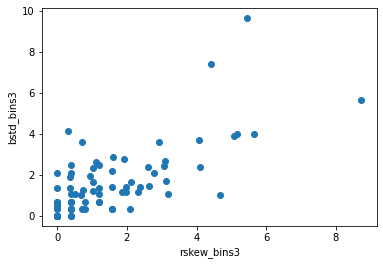

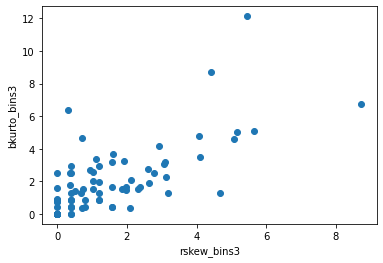

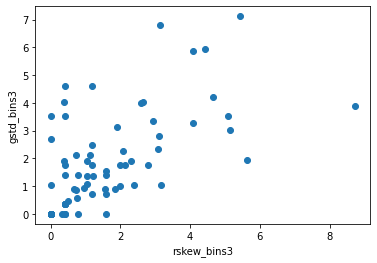

In [13]:
# BONUS:
# let's plot the correlation of the features in the correlated group from the
# previous cell

for feature in group['feature2']:
    plt.scatter(X_train['rskew_bins3'], X_train[feature])
    plt.xlabel('rskew_bins3')
    plt.ylabel(feature)
    plt.show()

In [14]:
X = data.iloc[:,:-1]  #independent columns
y = data.iloc[:,-1]    #target column i.e price range
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers

[2.46225604e-03 8.89094890e-03 3.19000978e-04 1.58378812e-04
 1.81787744e-02 1.01144915e-01 8.75147761e-04 3.16725421e-03
 3.24716018e-03 3.49474663e-04 6.40498657e-05 3.84728352e-05
 2.30995605e-04 4.84087237e-02 2.84293461e-04 2.39471822e-03
 9.63430578e-03 1.02997735e-03 8.87688519e-05 2.66574764e-05
 2.49196540e-03 4.01619427e-02 3.43821475e-04 2.14460903e-03
 2.10386890e-03 2.31855119e-04 5.87001684e-05 3.50496126e-05
 4.45158263e-03 4.17553257e-02 2.20782050e-04 2.73787522e-03
 3.13623042e-03 5.96678309e-03 3.53317785e-04 1.55980604e-04
 8.81742264e-03 5.01509569e-02 1.22030066e-03 2.76173293e-03
 3.51381958e-03 2.48490691e-03 6.51098661e-05 2.91821200e-05
 8.72555997e-04 6.61893588e-02 1.86226844e-04 4.17744444e-03
 3.90567240e-02 9.64093368e-04 6.54574029e-05 3.10241058e-05
 5.13979360e-03 4.00337630e-02 2.36600975e-04 1.57128758e-02
 3.40574495e-03 3.74630747e-04 7.52782691e-05 2.51055132e-05
 4.42987301e-03 5.93211829e-02 2.10466827e-04 3.00285505e-03
 2.53518927e-03 1.495284

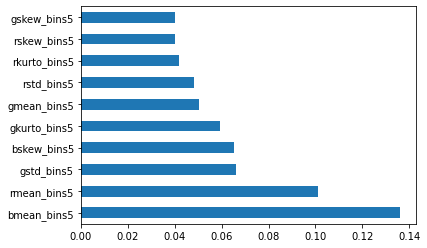

In [15]:
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

# Understanding the data:

In [16]:
data.describe()

,rmean_bins0,rmean_bins1,rmean_bins2,rmean_bins3,rmean_bins4,rmean_bins5,rmean_bins6,rmean_bins7,rstd_bins0,rstd_bins1,...,bskew_bins7,bkurto_bins0,bkurto_bins1,bkurto_bins2,bkurto_bins3,bkurto_bins4,bkurto_bins5,bkurto_bins6,bkurto_bins7,class
count,23999.000000,23999.000000,23999.000000,23999.000000,23999.000000,23999.000000,23999.000000,23999.000000,23999.000000,23999.000000,...,23999.000000,23999.000000,23999.000000,23999.000000,23999.000000,23999.000000,23999.000000,23999.000000,23999.000000,23999.000000
mean,0.582704,20.236670,1.002494,1.067551,32.507823,65.214795,7.312602,162.191853,2.604977,0.272439,...,8.086517,11.097352,0.477081,0.026226,0.010230,0.921996,4.774251,0.138770,11.013110,0.500021
std,0.700146,42.042905,10.206704,11.187760,55.523277,69.017707,29.867961,16.595617,3.750341,0.787477,...,3.314680,13.340849,1.322957,0.487332,0.220526,2.125290,5.577464,0.898955,3.796595,0.500010
min,0.069455,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,117.076176,0.402347,0.000000,...,1.641478,1.164208,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.194781,0.000000
25%,0.224174,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,147.861875,0.689139,0.000000,...,5.673195,1.830983,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.520607,0.000000
50%,0.402406,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,156.995048,1.122995,0.000000,...,7.472301,6.464863,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10.173925,1.000000
75%,0.668332,0.000000,0.000000,0.000000,100.705939,128.687261,0.000000,178.737732,2.040185,0.000000,...,9.575986,9.587820,0.000000,0.000000,0.000000,0.000000,9.772685,0.000000,12.626787,1.000000
max,16.089146,159.400000,148.000000,145.000000,170.796610,181.880368,200.062500,207.141488,39.092584,13.993407,...,33.543546,84.033683,18.370593,19.976124,12.118610,21.444822,36.168959,17.458315,40.435589,1.000000


In [17]:
data_desc = data.describe()
a = pd.DataFrame(data_desc.loc['mean'])

## Red Channel:

In [18]:
r = pd.read_csv('csv/image_bins_stats_r.csv')
r = r.drop(['filename'], axis=1)

In [19]:
r.describe()

,rmean_bins0,rmean_bins1,rmean_bins2,rmean_bins3,rmean_bins4,rmean_bins5,rmean_bins6,rmean_bins7,rstd_bins0,rstd_bins1,...,rskew_bins7,rkurto_bins0,rkurto_bins1,rkurto_bins2,rkurto_bins3,rkurto_bins4,rkurto_bins5,rkurto_bins6,rkurto_bins7,class
count,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,...,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.00000
mean,0.582689,20.235826,1.002453,1.067506,32.506468,65.212077,7.312297,162.190977,2.604897,0.272428,...,7.213096,7.976251,0.342993,0.013644,0.007769,0.983780,4.055282,0.159745,8.867690,0.50000
std,0.700135,42.042232,10.206494,11.187529,55.522517,69.017552,29.867376,16.595827,3.750283,0.787463,...,2.313537,11.420274,0.996961,0.241057,0.171552,2.132630,4.661674,1.010262,2.743116,0.50001
min,0.069455,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,117.076176,0.402347,0.000000,...,2.099638,1.120316,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.580948,0.00000
25%,0.224169,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,147.861420,0.689139,0.000000,...,5.597516,1.479592,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.974552,0.00000
50%,0.402396,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,156.994668,1.122958,0.000000,...,6.982877,2.142352,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.634009,0.50000
75%,0.668326,0.000000,0.000000,0.000000,100.697797,128.687142,0.000000,178.737571,2.040161,0.000000,...,8.556503,5.249201,0.000000,0.000000,0.000000,0.000000,8.352935,0.000000,10.503312,1.00000
max,16.089146,159.400000,148.000000,145.000000,170.796610,181.880368,200.062500,207.141488,39.092584,13.993407,...,24.124860,65.431316,16.254597,10.467536,9.249861,17.558877,27.706244,25.121105,27.887029,1.00000


In [20]:
r.describe().loc['mean']

rmean_bins0       0.582689
rmean_bins1      20.235826
rmean_bins2       1.002453
rmean_bins3       1.067506
rmean_bins4      32.506468
rmean_bins5      65.212077
rmean_bins6       7.312297
rmean_bins7     162.190977
rstd_bins0        2.604897
rstd_bins1        0.272428
rstd_bins2        0.011093
rstd_bins3        0.006279
rstd_bins4        0.769778
rstd_bins5        3.132833
rstd_bins6        0.127947
rstd_bins7        5.498971
rskew_bins0       5.318043
rskew_bins1       0.312493
rskew_bins2       0.012640
rskew_bins3       0.007165
rskew_bins4       0.889472
rskew_bins5       3.633386
rskew_bins6       0.146739
rskew_bins7       7.213096
rkurto_bins0      7.976251
rkurto_bins1      0.342993
rkurto_bins2      0.013644
rkurto_bins3      0.007769
rkurto_bins4      0.983780
rkurto_bins5      4.055282
rkurto_bins6      0.159745
rkurto_bins7      8.867690
class             0.500000
Name: mean, dtype: float64

There is very high variance from column to columns which is not desired. Notice how variance from rmean_bins0 to 7 differs by high amount of values. rstd, rskew and rkurto are almost stable.

In [21]:
r.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24000 entries, 0 to 23999
Data columns (total 33 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   rmean_bins0   24000 non-null  float64
 1   rmean_bins1   24000 non-null  float64
 2   rmean_bins2   24000 non-null  float64
 3   rmean_bins3   24000 non-null  float64
 4   rmean_bins4   24000 non-null  float64
 5   rmean_bins5   24000 non-null  float64
 6   rmean_bins6   24000 non-null  float64
 7   rmean_bins7   24000 non-null  float64
 8   rstd_bins0    24000 non-null  float64
 9   rstd_bins1    24000 non-null  float64
 10  rstd_bins2    24000 non-null  float64
 11  rstd_bins3    24000 non-null  float64
 12  rstd_bins4    24000 non-null  float64
 13  rstd_bins5    24000 non-null  float64
 14  rstd_bins6    24000 non-null  float64
 15  rstd_bins7    24000 non-null  float64
 16  rskew_bins0   24000 non-null  float64
 17  rskew_bins1   24000 non-null  float64
 18  rskew_bins2   24000 non-nu

In [22]:
r.isnull().sum()

rmean_bins0     0
rmean_bins1     0
rmean_bins2     0
rmean_bins3     0
rmean_bins4     0
rmean_bins5     0
rmean_bins6     0
rmean_bins7     0
rstd_bins0      0
rstd_bins1      0
rstd_bins2      0
rstd_bins3      0
rstd_bins4      0
rstd_bins5      0
rstd_bins6      0
rstd_bins7      0
rskew_bins0     0
rskew_bins1     0
rskew_bins2     0
rskew_bins3     0
rskew_bins4     0
rskew_bins5     0
rskew_bins6     0
rskew_bins7     0
rkurto_bins0    0
rkurto_bins1    0
rkurto_bins2    0
rkurto_bins3    0
rkurto_bins4    0
rkurto_bins5    0
rkurto_bins6    0
rkurto_bins7    0
class           0
dtype: int64

In [23]:
r.duplicated().sum()

0

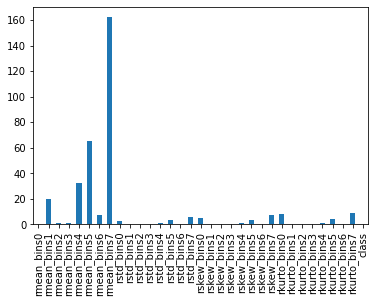

In [24]:
r.describe().loc['mean'].plot.bar()

From this graph, we come to know that these values require standardization and normalisation during ML training.

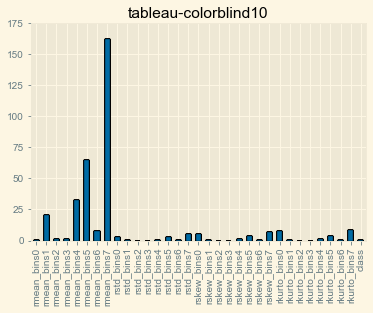

In [25]:
for style in plt.style.available:
    plt.style.use(style)
    r.describe().loc['mean'].plot.bar()
    plt.title(style)
    plt.savefig('plots/'+style+'.png')

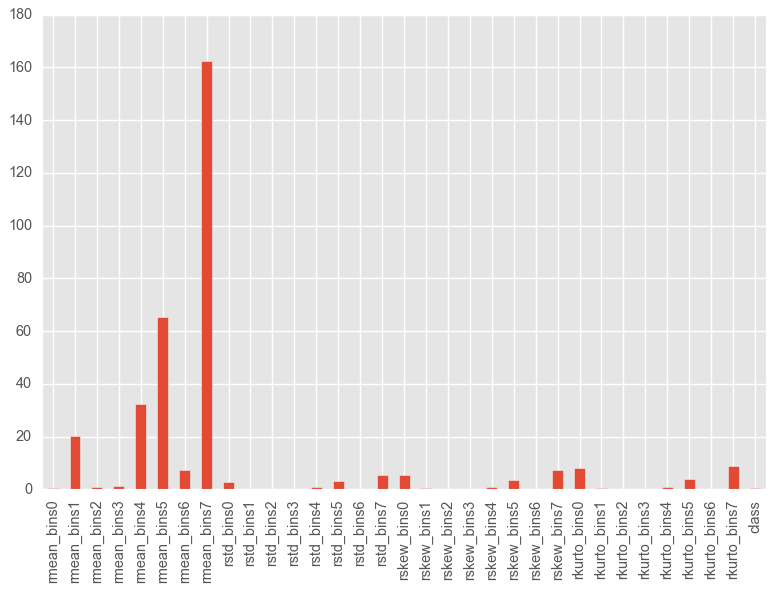

In [26]:
plt.style.use('ggplot')
r.describe().loc['mean'].plot.bar()

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


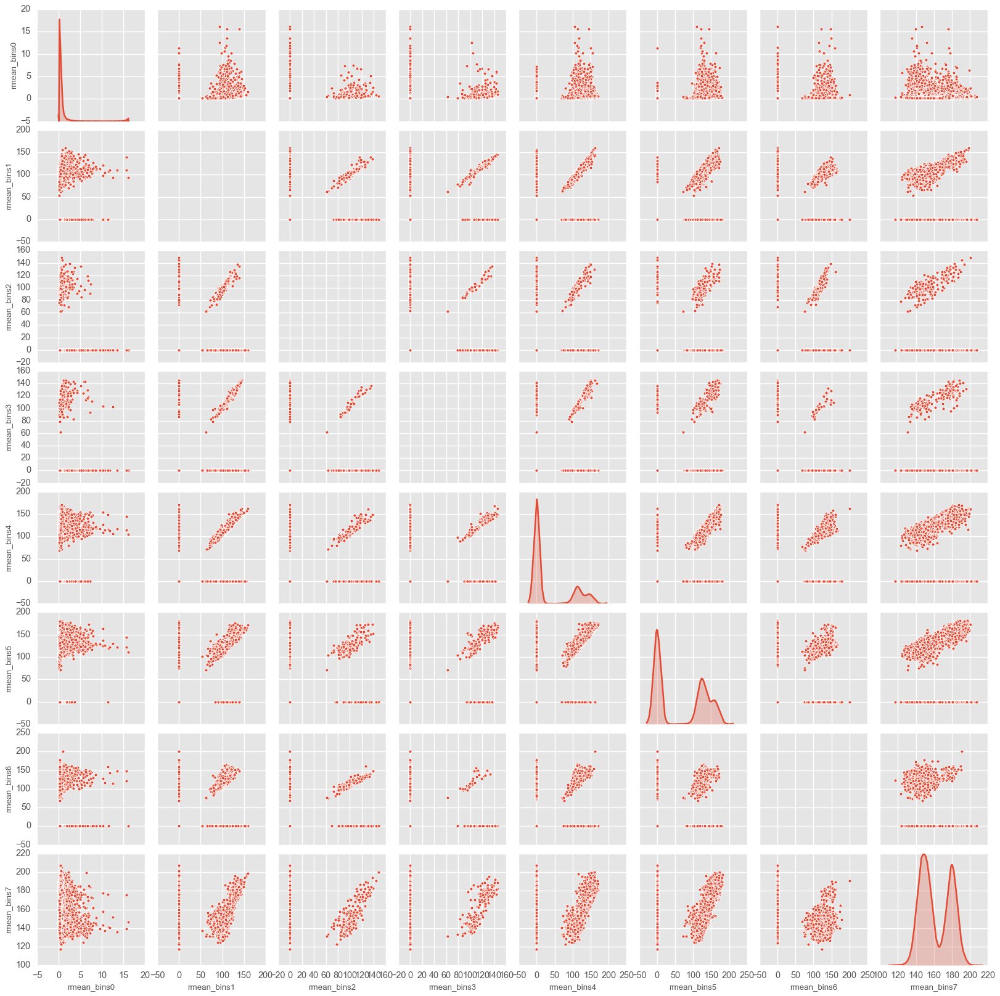

In [27]:
sns.pairplot(r.iloc[:, np.hstack(([0], range(1, 8)))], diag_kind='kde')

It can be noticed that rmean_bins0 has no definite correlation with other columns and there is high positive correlation among rmean_bins0 to rmean_bins7. Also notice how much the rmean_bins7 slope increases due to its high value.

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


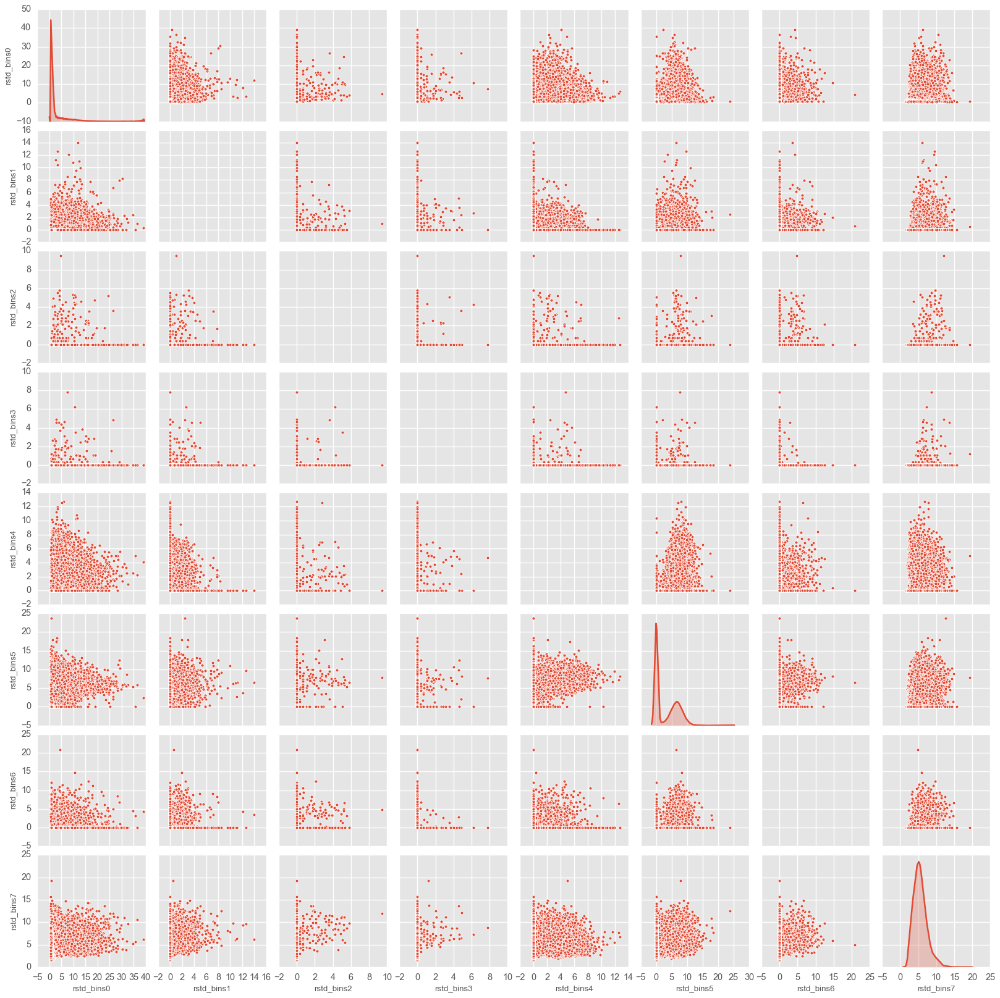

In [28]:
sns.pairplot(r.iloc[:, np.hstack((range(8, 16)))], diag_kind='kde')

Notice that rstd bin values do not have any correlation amongst each other and are simply scattered in all directions.

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


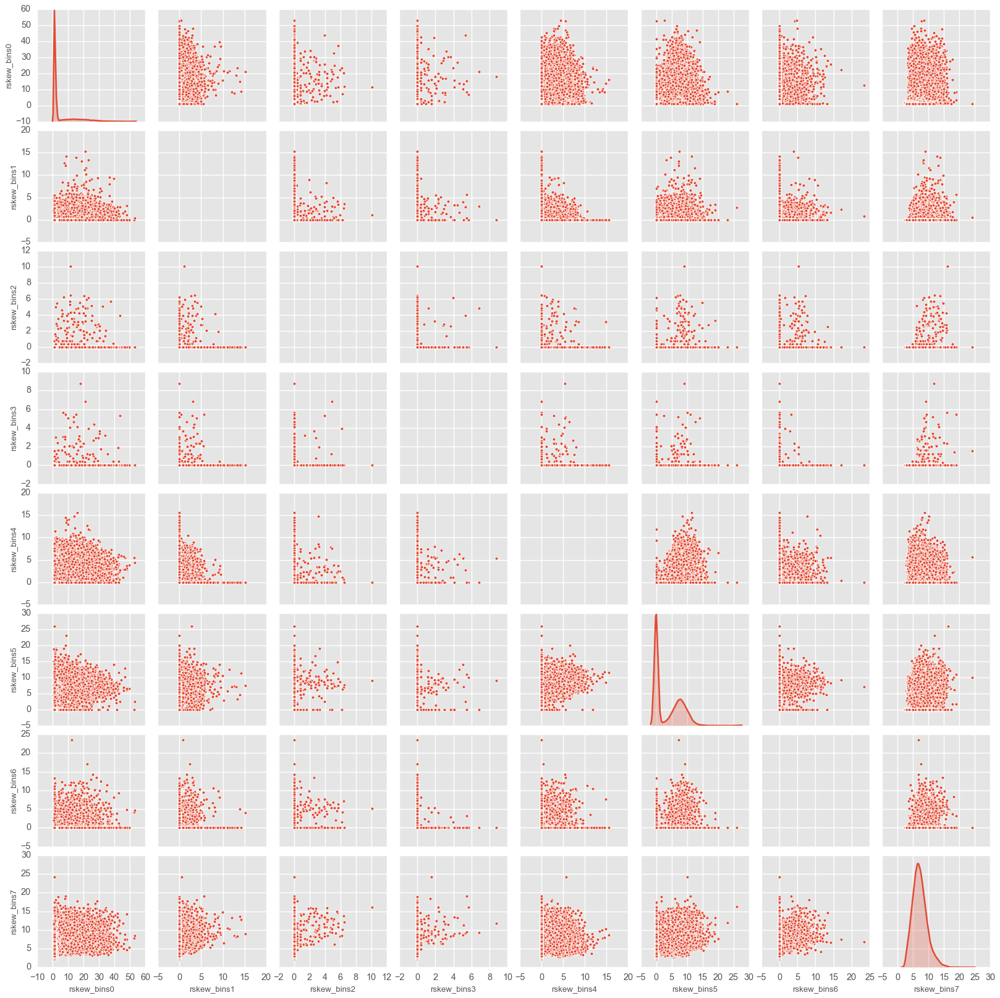

In [29]:
sns.pairplot(r.iloc[:, np.hstack((range(16, 24)))], diag_kind='kde')

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


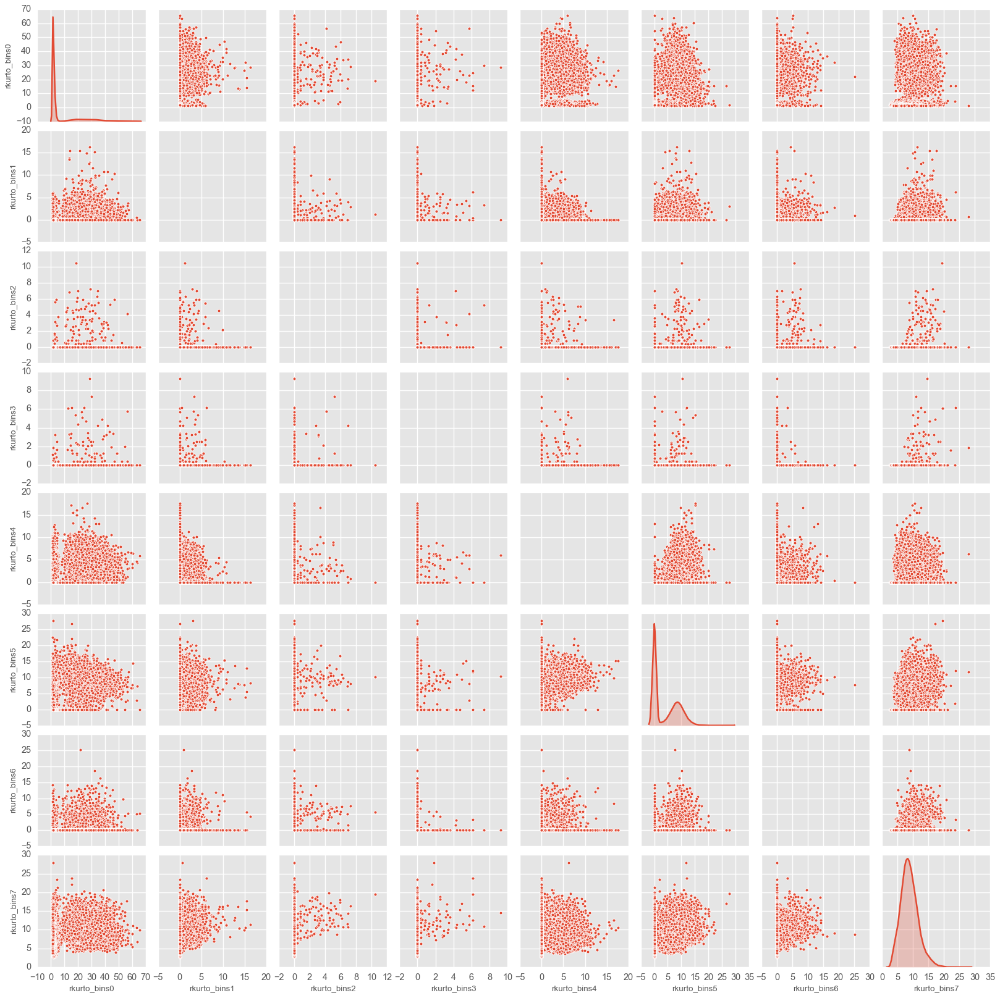

In [30]:
sns.pairplot(r.iloc[:, np.hstack((range(24, 32)))], diag_kind='kde')

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Defa

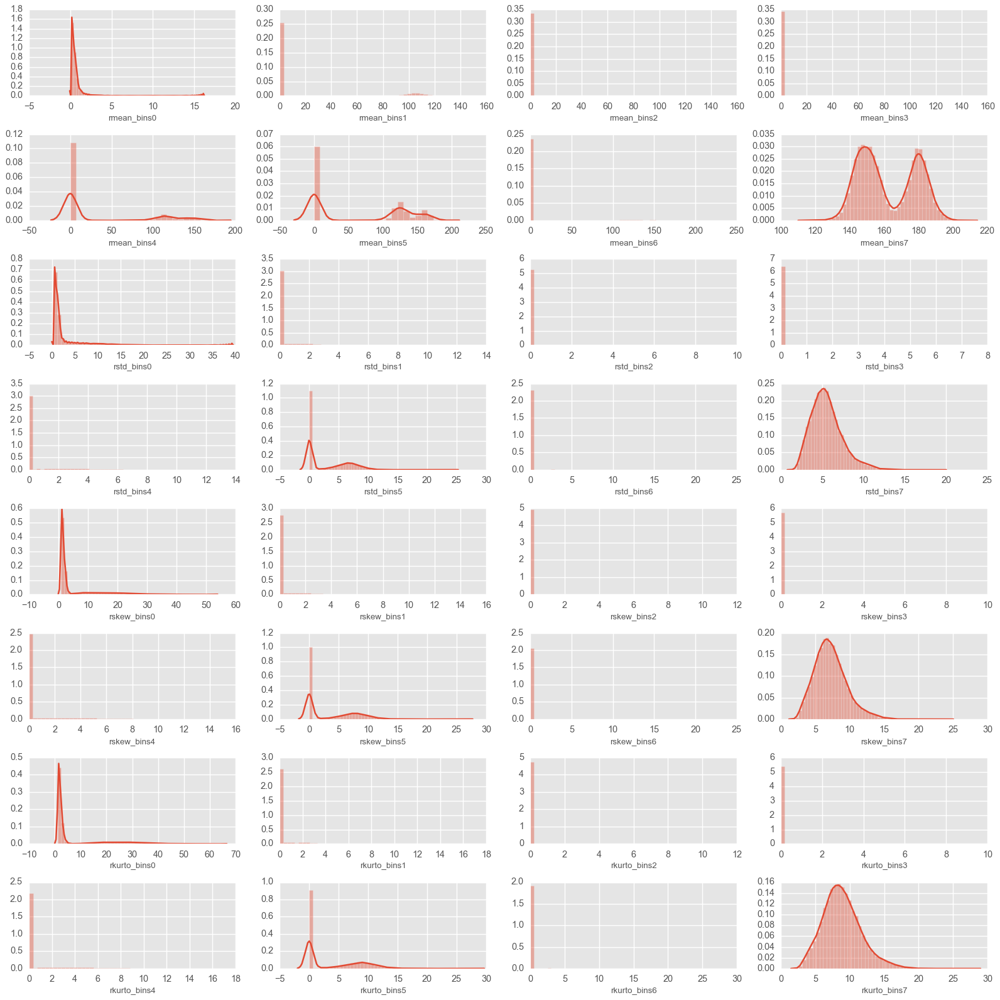

In [31]:
rows = 8
cols = 4

fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize= (20, 20))
col = r.columns
index = 0

for i in range(rows):
    for j in range(cols):
        sns.distplot(r[col[index]], ax = ax[i][j])
        index += 1

plt.tight_layout()

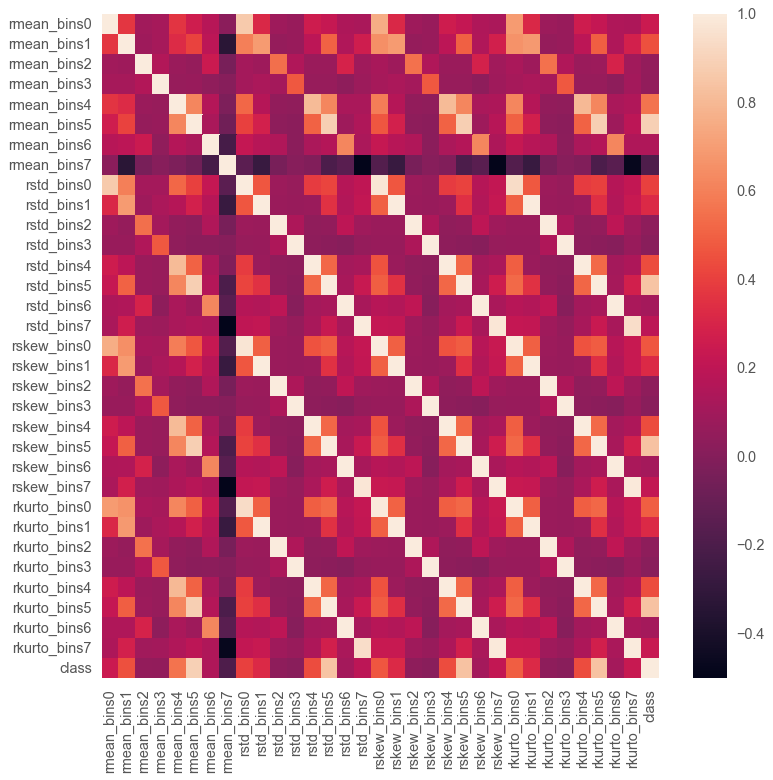

In [32]:
corrmat = r.corr()
fig, ax = plt.subplots(figsize = (10,10))
sns.heatmap(corrmat)

However, we know from the previous visualizations that std values have a high correlation with rskew and rkurto values, even if they don't have correlations high enough amongst themselves. So we wish to know the highest correlations by keeping threshold values > 0.5 with the class attribute. This will help us decide which attributes contribute largest to the prediction of our class.

In [33]:
def getCorrelatedFeatures(corrdata, threshold):
    feature = []
    value = []
    
    for i, index in enumerate(corrdata.index):
        if abs(corrdata[index]) > threshold:
            feature.append(index)
            value.append(corrdata[index])
            
    df = pd.DataFrame(data = value, index=feature, columns=['Correlation Values'])
    
    return df

In [34]:
corr_df = getCorrelatedFeatures(corrmat['class'], 0.5)

In [35]:
corr_df

,Correlation Values
rmean_bins4,0.560230
rmean_bins5,0.890926
rstd_bins5,0.842171
rskew_bins5,0.840368
rkurto_bins5,0.837524
class,1.000000


In [36]:
corrmat = corrmat.abs().unstack() # absolute value of corr coef
corrmat = corrmat.sort_values(ascending=False)
corrmat = corrmat[corrmat >= 0.5]
corrmat = corrmat[corrmat < 1]
corrmat = pd.DataFrame(corrmat).reset_index()
corrmat.columns = ['feature1', 'feature2', 'correlation values']
corrmat.head()
corrmat.tail()

,feature1,feature2,correlation values
151,rstd_bins1,rkurto_bins0,0.501112
152,rmean_bins1,rskew_bins5,0.501058
153,rskew_bins5,rmean_bins1,0.501058
154,rmean_bins7,rstd_bins7,0.500127
155,rstd_bins7,rmean_bins7,0.500127


In [37]:
# find groups of correlated features

grouped_feature_ls = []
correlated_groups = []

for feature in corrmat.feature1.unique():
    
    if feature not in grouped_feature_ls:

        # find all features correlated to a single feature
        correlated_block = corrmat[corrmat.feature1 == feature]
        grouped_feature_ls = grouped_feature_ls + list(
            correlated_block.feature2.unique()) + [feature]

        # append the block of features to the list
        correlated_groups.append(correlated_block)

print('found {} correlated groups'.format(len(correlated_groups)))

found 9 correlated groups


In [38]:
for group in correlated_groups:
    print(group)
    print()

       feature1      feature2  correlation values
0   rskew_bins3  rkurto_bins3            0.999638
11  rskew_bins3    rstd_bins3            0.999234

         feature1     feature2  correlation values
2    rkurto_bins2  rskew_bins2            0.999537
27   rkurto_bins2   rstd_bins2            0.997180
106  rkurto_bins2  rmean_bins2            0.550959

         feature1      feature2  correlation values
4    rkurto_bins4   rskew_bins4            0.999449
29   rkurto_bins4    rstd_bins4            0.996949
69   rkurto_bins4   rmean_bins4            0.805227
120  rkurto_bins4  rkurto_bins5            0.525124
128  rkurto_bins4   rskew_bins5            0.522950
137  rkurto_bins4    rstd_bins5            0.519012
145  rkurto_bins4   rmean_bins5            0.503207

        feature1      feature2  correlation values
6    rskew_bins1  rkurto_bins1            0.999357
18   rskew_bins1    rstd_bins1            0.998708
77   rskew_bins1   rmean_bins1            0.690654
147  rskew_bins1  rkurt

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]),
 <a list of 33 Text major ticklabel objects>)

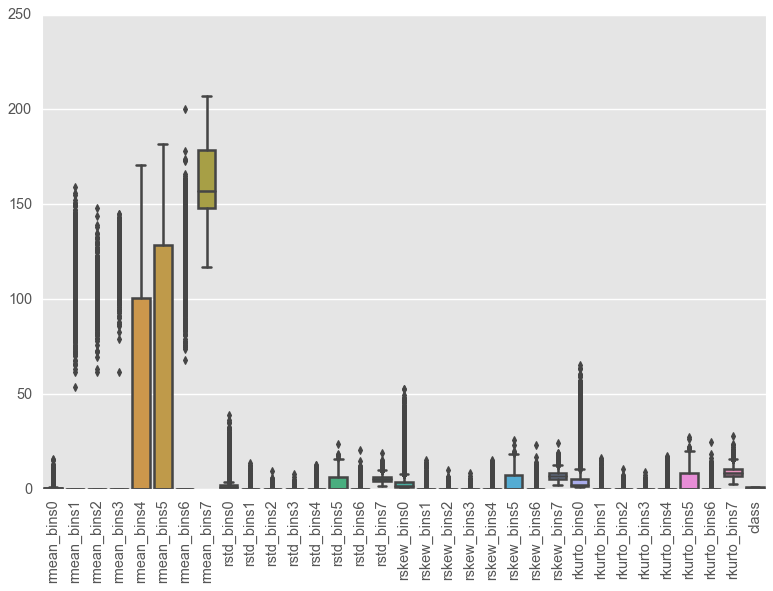

In [41]:
sns.boxplot(data=r)
plt.xticks(rotation=90)

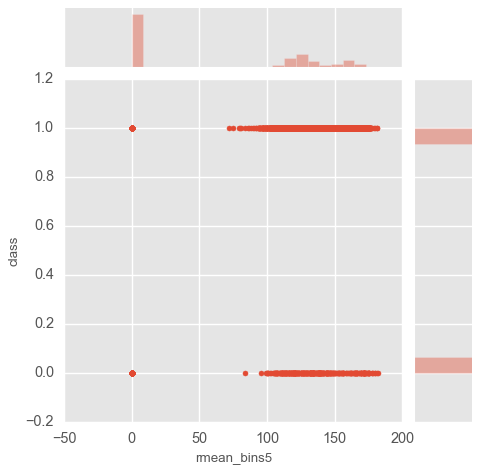

In [42]:
sns.jointplot(x = r['rmean_bins5'], y = r['class'])

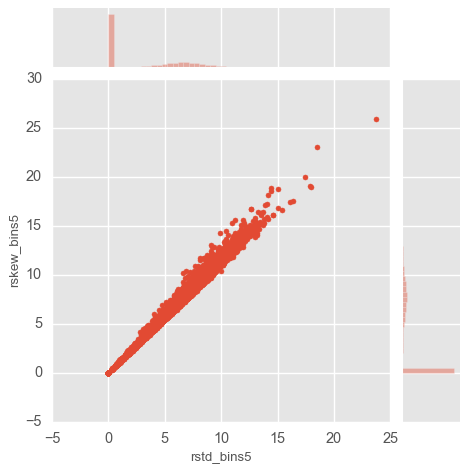

In [43]:
sns.jointplot(x = r['rstd_bins5'], y = r['rskew_bins5'])

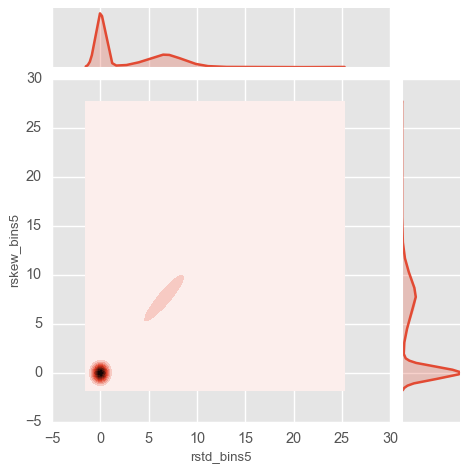

In [44]:
sns.jointplot(x = r['rstd_bins5'], y = r['rskew_bins5'], kind='kde')

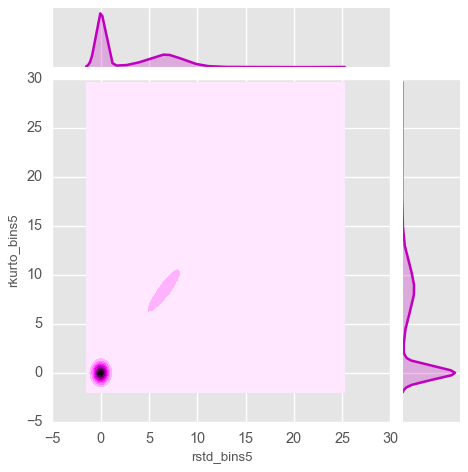

In [45]:
sns.jointplot(x = r['rstd_bins5'], y = r['rkurto_bins5'], kind='kde', color='m')

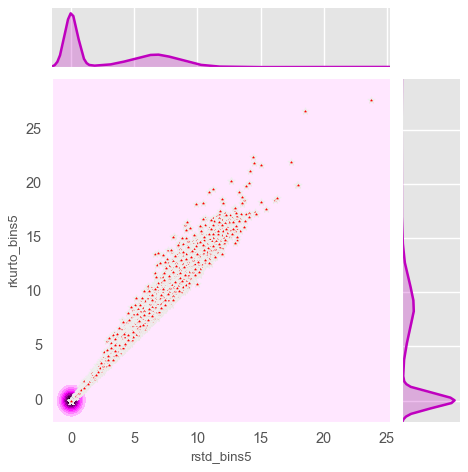

In [46]:
g = sns.jointplot(x = r['rstd_bins5'], y = r['rkurto_bins5'], kind='kde', color='m')
g.plot_joint(plt.scatter, c='r', s=40, linewidth=1, marker='*')

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Defa

IndexError: index 8 is out of bounds for axis 0 with size 8

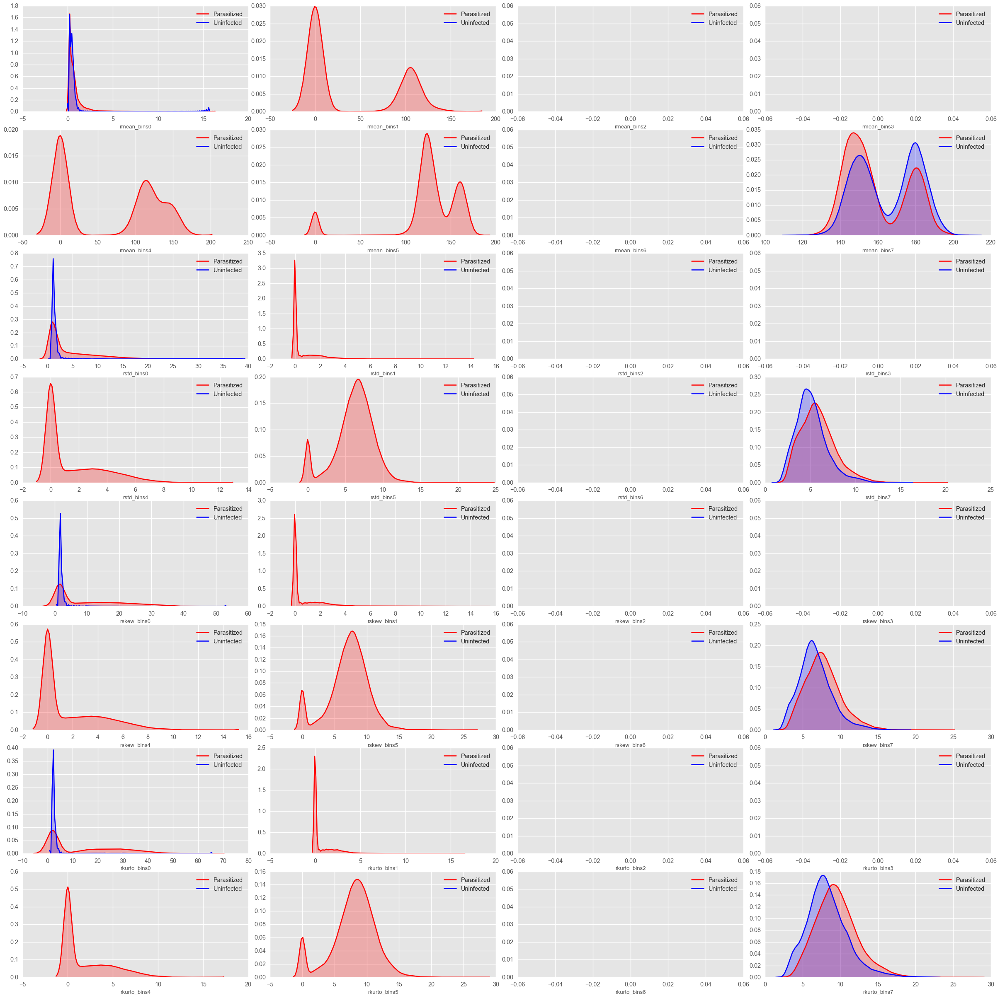

In [47]:
parasitized_df = r[r['class'] == 1]
uninfected_df = r[r['class'] == 0]

num_rows, num_cols = 5,2
rows = 8
cols = 4

fig, axes = plt.subplots(rows, cols, figsize=(30, 30))
fig.tight_layout()

for index, column in enumerate(r.columns):
    i,j = (index // cols, index % cols)
    g = sns.kdeplot(parasitized_df[column], color="Red", shade=True, ax=axes[i,j])
    g = sns.kdeplot(uninfected_df[column], ax=g, color="Blue", shade=True)
    g.set_xlabel(column)
    g = g.legend(["Parasitized","Uninfected"])

## Green Channel:

In [48]:
g = pd.read_csv('csv/image_bins_stats_g.csv')
g.head()

,filename,gmean_bins0,gmean_bins1,gmean_bins2,gmean_bins3,gmean_bins4,gmean_bins5,gmean_bins6,gmean_bins7,gstd_bins0,...,gskew_bins7,gkurto_bins0,gkurto_bins1,gkurto_bins2,gkurto_bins3,gkurto_bins4,gkurto_bins5,gkurto_bins6,gkurto_bins7,class
0,clean_p_1.jpg,0.860992,80.666667,0.0,0.0,0.000000,98.758621,0.0,159.229729,5.551669,...,8.796488,18.068694,9.542573,0.0,0.0,0.000000,16.003671,0.0,10.573824,1
1,clean_p_2.jpg,0.271605,89.500000,0.0,0.0,0.000000,62.264286,0.0,156.332014,0.747069,...,9.072311,1.548899,2.102241,0.0,0.0,0.000000,26.133593,0.0,11.809115,1
2,clean_p_3.jpg,0.852419,105.000000,0.0,0.0,39.769231,96.892857,0.0,159.662845,6.250094,...,7.861639,21.827919,5.045378,0.0,0.0,21.484181,29.056961,0.0,10.287724,1
3,clean_p_4.jpg,0.198073,74.000000,0.0,0.0,0.000000,72.151111,0.0,163.375576,0.638839,...,13.020835,1.461975,2.770946,0.0,0.0,0.000000,22.446370,0.0,17.351376,1
4,clean_p_5.jpg,0.242324,0.000000,0.0,0.0,0.000000,0.000000,0.0,164.024781,0.683991,...,5.260356,1.478244,0.000000,0.0,0.0,0.000000,0.000000,0.0,6.509571,1


In [49]:
g = g.drop(['filename'], axis=1)

In [50]:
g.describe()

,gmean_bins0,gmean_bins1,gmean_bins2,gmean_bins3,gmean_bins4,gmean_bins5,gmean_bins6,gmean_bins7,gstd_bins0,gstd_bins1,...,gskew_bins7,gkurto_bins0,gkurto_bins1,gkurto_bins2,gkurto_bins3,gkurto_bins4,gkurto_bins5,gkurto_bins6,gkurto_bins7,class
count,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,...,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.00000
mean,0.346991,12.576331,0.932745,0.975804,13.940722,38.175597,6.986928,151.817642,1.494461,1.243152,...,10.120052,4.668733,1.573825,0.016720,0.010308,3.120569,9.104651,0.215668,13.553990,0.50000
std,0.345101,27.723684,9.515219,10.264426,26.833138,41.763202,28.666221,16.474163,1.978290,3.690600,...,4.970425,6.541976,4.675380,0.310244,0.217260,6.771666,11.281075,1.415230,5.727125,0.50001
min,0.074523,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,72.282821,0.406111,0.000000,...,1.913479,1.065437,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.296634,0.00000
25%,0.219317,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,143.087968,0.667017,0.000000,...,6.535983,1.425769,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.707038,0.00000
50%,0.263496,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,153.521889,0.730815,0.000000,...,9.174048,1.504964,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.451966,0.50000
75%,0.327628,0.000000,0.000000,0.000000,16.378472,78.063610,0.000000,162.917034,0.874490,0.000000,...,12.401419,1.742090,0.000000,0.000000,0.000000,0.000000,18.821380,0.000000,16.094032,1.00000
max,12.556473,133.500000,141.500000,146.800000,138.500000,141.333333,178.666667,189.748673,32.231940,40.295749,...,47.094464,52.384295,48.255996,16.027769,9.138973,46.073338,47.574736,38.409460,54.040181,1.00000


In [51]:
g.describe().loc['mean']

gmean_bins0       0.346991
gmean_bins1      12.576331
gmean_bins2       0.932745
gmean_bins3       0.975804
gmean_bins4      13.940722
gmean_bins5      38.175597
gmean_bins6       6.986928
gmean_bins7     151.817642
gstd_bins0        1.494461
gstd_bins1        1.243152
gstd_bins2        0.013456
gstd_bins3        0.008305
gstd_bins4        2.417354
gstd_bins5        7.513982
gstd_bins6        0.172229
gstd_bins7        8.623643
gskew_bins0       2.808483
gskew_bins1       1.430887
gskew_bins2       0.015188
gskew_bins3       0.009146
gskew_bins4       2.805115
gskew_bins5       8.392318
gskew_bins6       0.194508
gskew_bins7      10.120052
gkurto_bins0      4.668733
gkurto_bins1      1.573825
gkurto_bins2      0.016720
gkurto_bins3      0.010308
gkurto_bins4      3.120569
gkurto_bins5      9.104651
gkurto_bins6      0.215668
gkurto_bins7     13.553990
class             0.500000
Name: mean, dtype: float64

There is very high variance from column to columns which is not desired. Notice how variance from gmean_bins0 to 7 differs by high amount of values. gstd, gskew and gkurto are almost stable except there is a noticeable change from gskew_bins6 to 7.

In [52]:
g.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24000 entries, 0 to 23999
Data columns (total 33 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   gmean_bins0   24000 non-null  float64
 1   gmean_bins1   24000 non-null  float64
 2   gmean_bins2   24000 non-null  float64
 3   gmean_bins3   24000 non-null  float64
 4   gmean_bins4   24000 non-null  float64
 5   gmean_bins5   24000 non-null  float64
 6   gmean_bins6   24000 non-null  float64
 7   gmean_bins7   24000 non-null  float64
 8   gstd_bins0    24000 non-null  float64
 9   gstd_bins1    24000 non-null  float64
 10  gstd_bins2    24000 non-null  float64
 11  gstd_bins3    24000 non-null  float64
 12  gstd_bins4    24000 non-null  float64
 13  gstd_bins5    24000 non-null  float64
 14  gstd_bins6    24000 non-null  float64
 15  gstd_bins7    24000 non-null  float64
 16  gskew_bins0   24000 non-null  float64
 17  gskew_bins1   24000 non-null  float64
 18  gskew_bins2   24000 non-nu

In [53]:
g.isnull().sum()

gmean_bins0     0
gmean_bins1     0
gmean_bins2     0
gmean_bins3     0
gmean_bins4     0
gmean_bins5     0
gmean_bins6     0
gmean_bins7     0
gstd_bins0      0
gstd_bins1      0
gstd_bins2      0
gstd_bins3      0
gstd_bins4      0
gstd_bins5      0
gstd_bins6      0
gstd_bins7      0
gskew_bins0     0
gskew_bins1     0
gskew_bins2     0
gskew_bins3     0
gskew_bins4     0
gskew_bins5     0
gskew_bins6     0
gskew_bins7     0
gkurto_bins0    0
gkurto_bins1    0
gkurto_bins2    0
gkurto_bins3    0
gkurto_bins4    0
gkurto_bins5    0
gkurto_bins6    0
gkurto_bins7    0
class           0
dtype: int64

In [54]:
g.duplicated().sum()

0

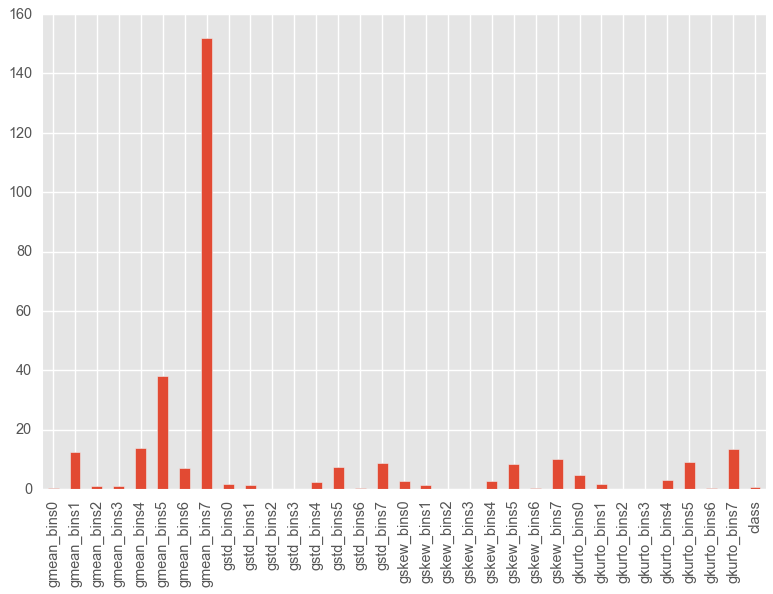

In [55]:
g.describe().loc['mean'].plot.bar()

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


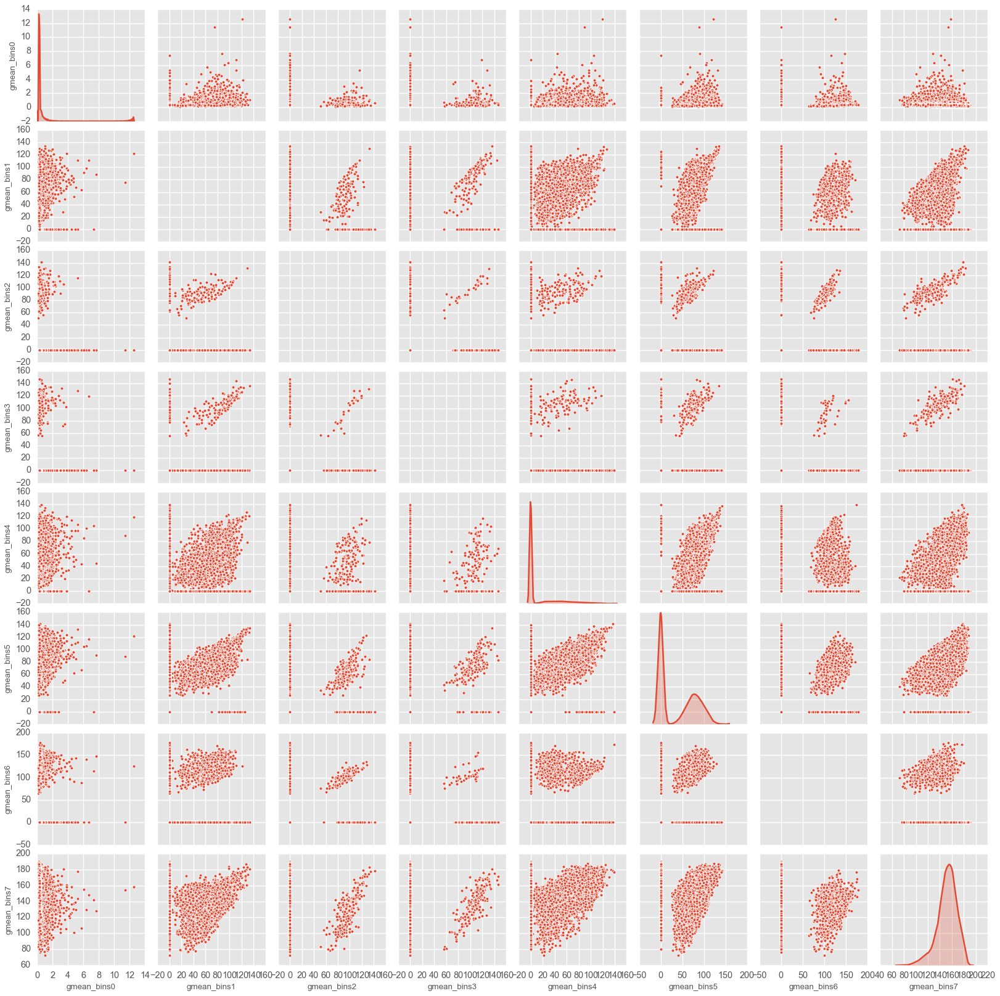

In [56]:
sns.pairplot(g.iloc[:, np.hstack(([0], range(1, 8)))], diag_kind='kde')

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


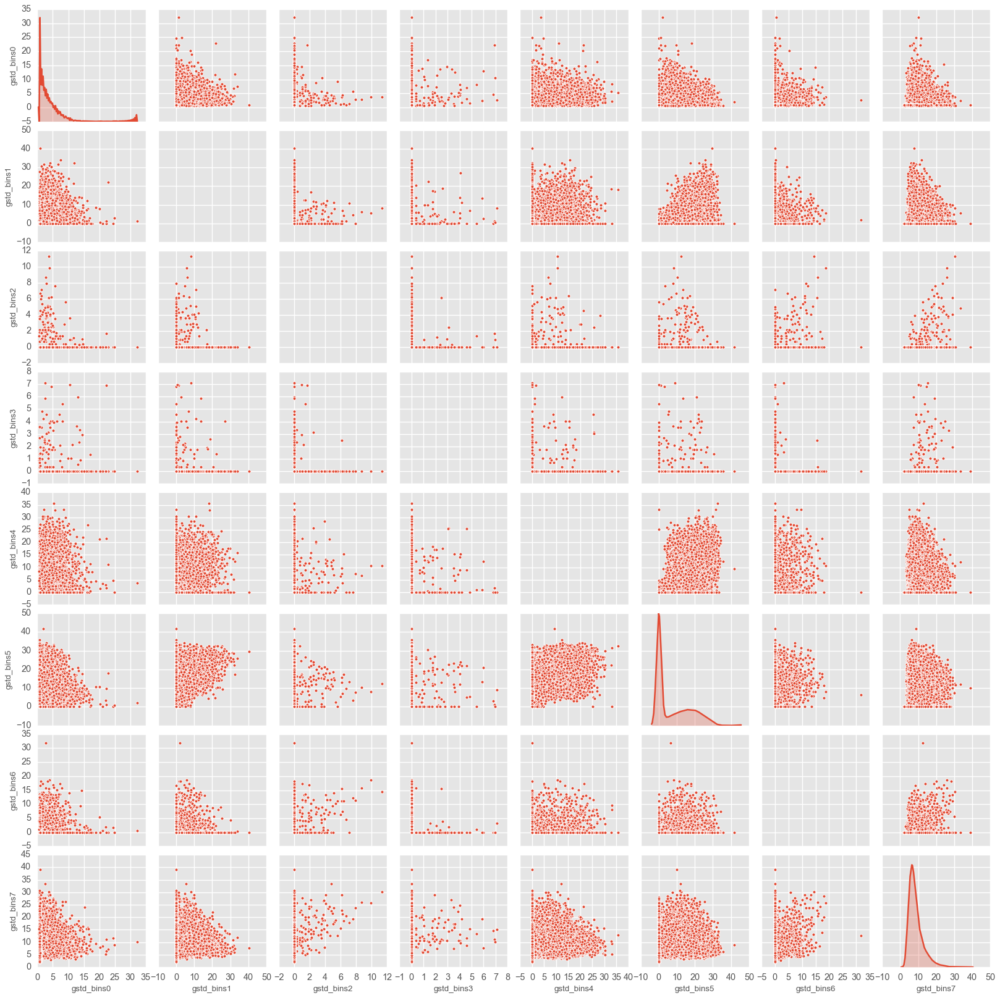

In [57]:
sns.pairplot(g.iloc[:, np.hstack((range(8, 16)))], diag_kind='kde')

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


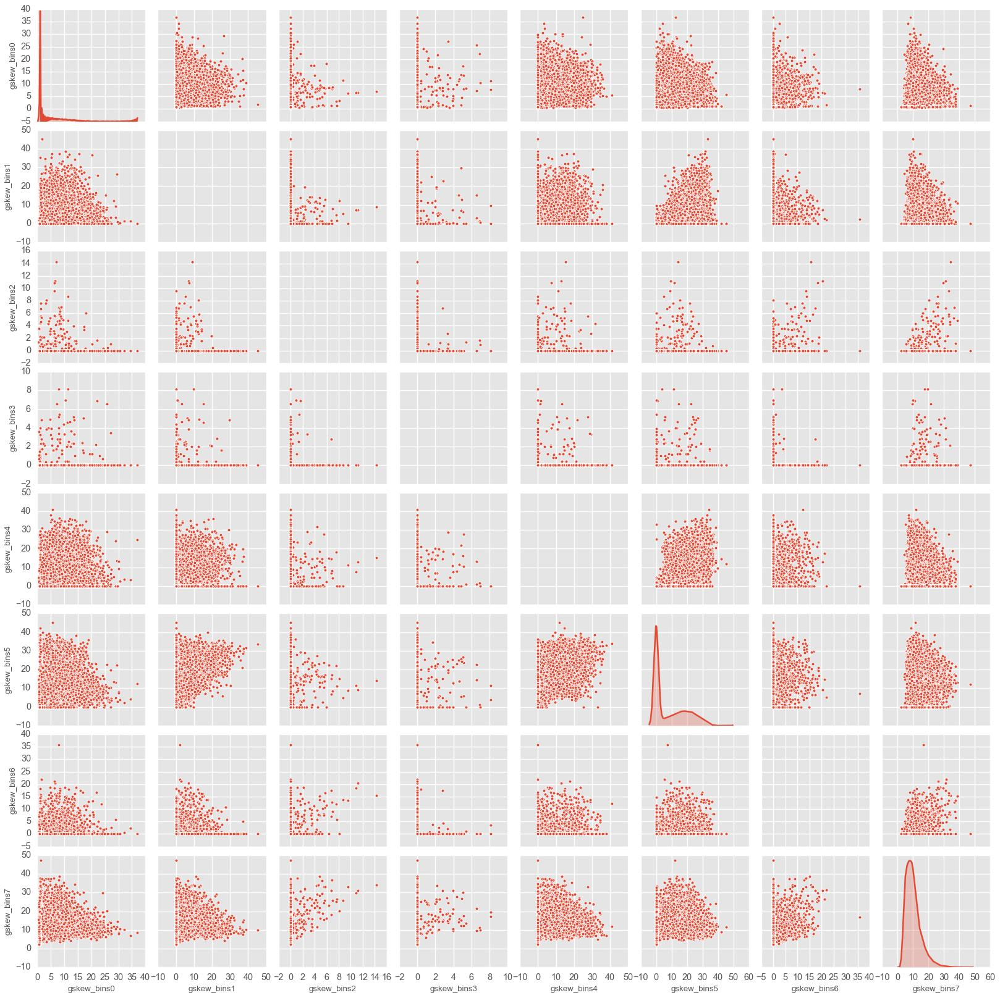

In [58]:
sns.pairplot(g.iloc[:, np.hstack((range(16, 24)))], diag_kind='kde')

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


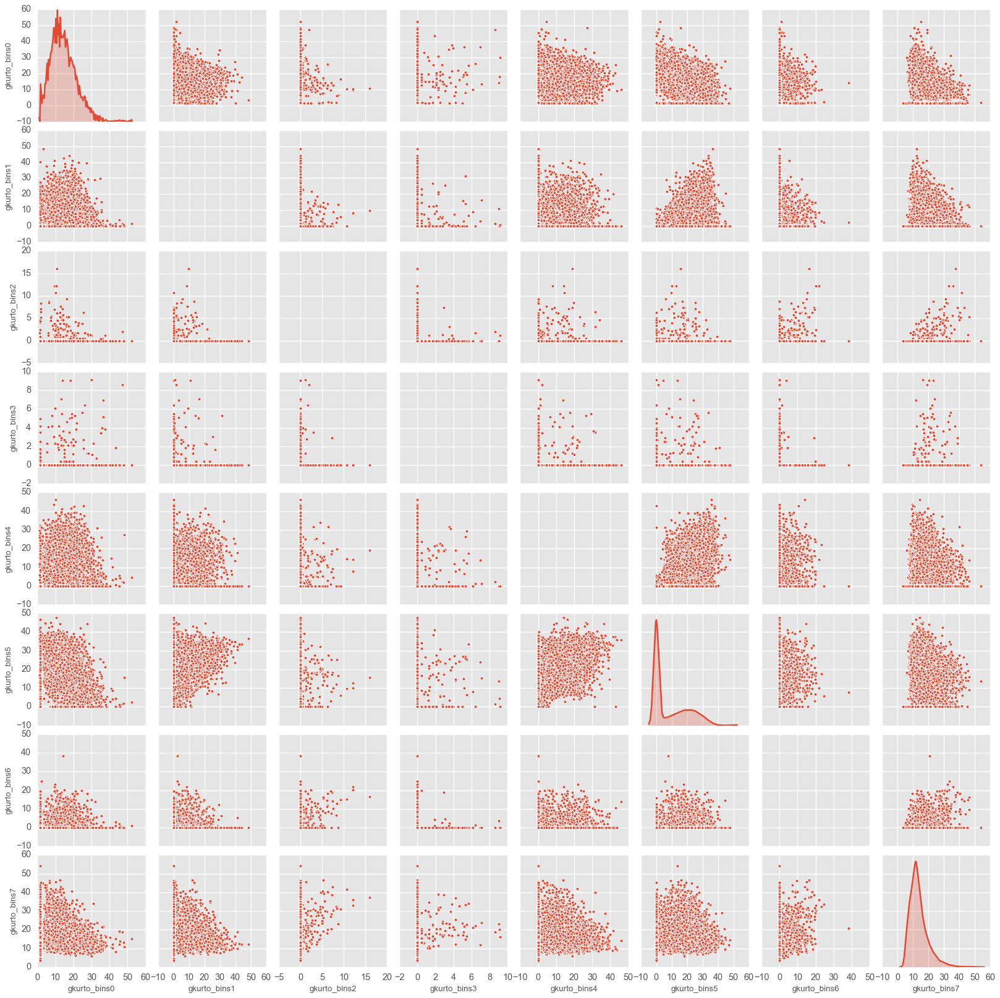

In [59]:
sns.pairplot(g.iloc[:, np.hstack((range(24, 32)))], diag_kind='kde')

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Defa

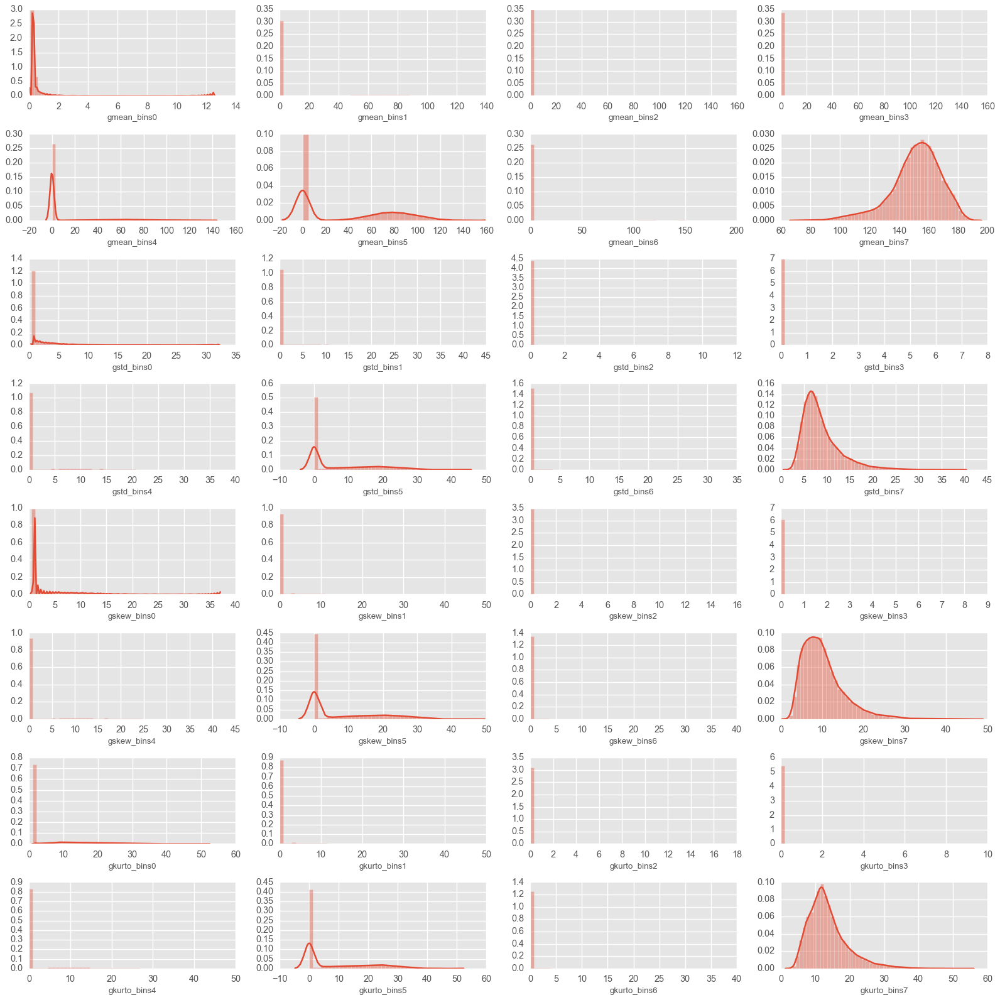

In [60]:
rows = 8
cols = 4

fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize= (20, 20))
col = g.columns
index = 0

for i in range(rows):
    for j in range(cols):
        sns.distplot(g[col[index]], ax = ax[i][j])
        index += 1

plt.tight_layout()

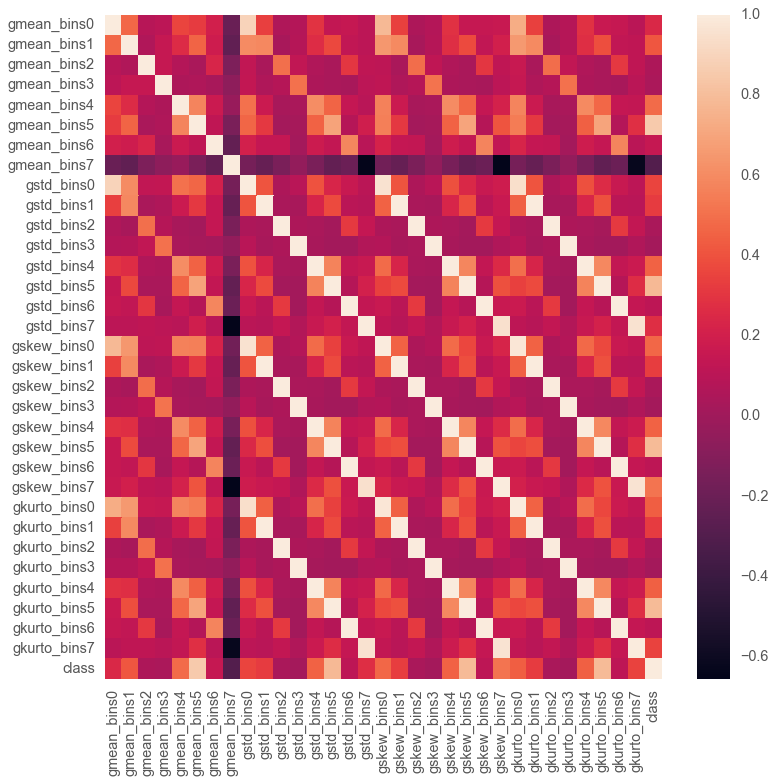

In [61]:
corrmat = g.corr()
fig, ax = plt.subplots(figsize = (10,10))
sns.heatmap(corrmat)

In [62]:
corr_df = getCorrelatedFeatures(corrmat['class'], 0.5)

In [63]:
corrmat = corrmat.abs().unstack() # absolute value of corr coef
corrmat = corrmat.sort_values(ascending=False)
corrmat = corrmat[corrmat >= 0.5]
corrmat = corrmat[corrmat < 1]
corrmat = pd.DataFrame(corrmat).reset_index()
corrmat.columns = ['feature1', 'feature2', 'correlation values']
corrmat.head()

,feature1,feature2,correlation values
0,gskew_bins5,gkurto_bins5,0.999260
1,gkurto_bins5,gskew_bins5,0.999260
2,gskew_bins1,gkurto_bins1,0.999025
3,gkurto_bins1,gskew_bins1,0.999025
4,gkurto_bins2,gskew_bins2,0.998999


In [64]:
# find groups of correlated features

grouped_feature_ls = []
correlated_groups = []

for feature in corrmat.feature1.unique():
    
    if feature not in grouped_feature_ls:

        # find all features correlated to a single feature
        correlated_block = corrmat[corrmat.feature1 == feature]
        grouped_feature_ls = grouped_feature_ls + list(
            correlated_block.feature2.unique()) + [feature]

        # append the block of features to the list
        correlated_groups.append(correlated_block)

print('found {} correlated groups'.format(len(correlated_groups)))

found 8 correlated groups


In [65]:
for group in correlated_groups:
    print(group)
    print()

        feature1      feature2  correlation values
0    gskew_bins5  gkurto_bins5            0.999260
9    gskew_bins5    gstd_bins5            0.998789
54   gskew_bins5         class            0.788488
64   gskew_bins5   gmean_bins5            0.696376
98   gskew_bins5   gskew_bins4            0.583887
101  gskew_bins5  gkurto_bins4            0.583640
104  gskew_bins5    gstd_bins4            0.580738

       feature1      feature2  correlation values
2   gskew_bins1  gkurto_bins1            0.999025
19  gskew_bins1    gstd_bins1            0.997907
86  gskew_bins1   gmean_bins1            0.593068

        feature1     feature2  correlation values
4   gkurto_bins2  gskew_bins2            0.998999
23  gkurto_bins2   gstd_bins2            0.997404

        feature1      feature2  correlation values
10   gskew_bins6    gstd_bins6            0.998271
24   gskew_bins6  gkurto_bins6            0.997331
112  gskew_bins6   gmean_bins6            0.576911

         feature1     feature2  co

In [66]:
corr_df

,Correlation Values
gmean_bins5,0.853018
gstd_bins5,0.784046
gskew_bins5,0.788488
gskew_bins7,0.516160
gkurto_bins5,0.788596
class,1.000000


In [67]:
correlated_data = g[corr_df.index]
correlated_data

,gmean_bins5,gstd_bins5,gskew_bins5,gskew_bins7,gkurto_bins5,class
0,98.758621,12.255016,14.259032,8.796488,16.003671,1
1,62.264286,22.315652,24.531394,9.072311,26.133593,1
2,96.892857,20.110605,24.891576,7.861639,29.056961,1
3,72.151111,19.525353,21.174848,13.020835,22.446370,1
4,0.000000,0.000000,0.000000,5.260356,0.000000,1
...,...,...,...,...,...,...
23995,0.000000,0.000000,0.000000,6.278290,0.000000,0
23996,0.000000,0.000000,0.000000,4.762729,0.000000,0
23997,0.000000,0.000000,0.000000,5.763246,0.000000,0
23998,0.000000,0.000000,0.000000,9.121810,0.000000,0


C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


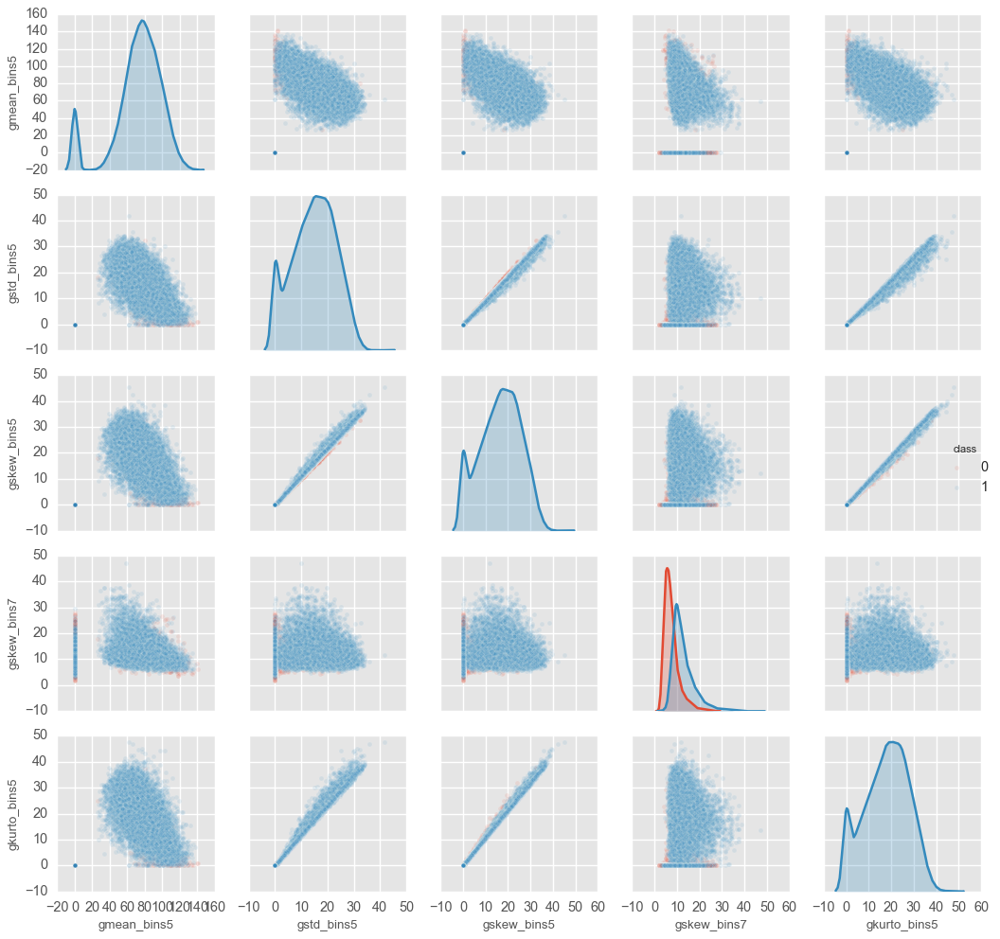

In [68]:
sns.pairplot(correlated_data, hue='class', plot_kws={'alpha':0.1})
plt.tight_layout()

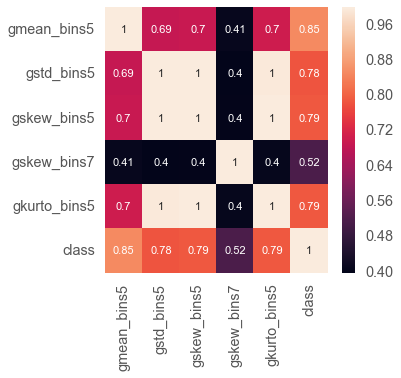

In [69]:
fig, ax = plt.subplots(figsize = (4,4))
sns.heatmap(correlated_data.corr(), annot=True)

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Defa

IndexError: index 8 is out of bounds for axis 0 with size 8

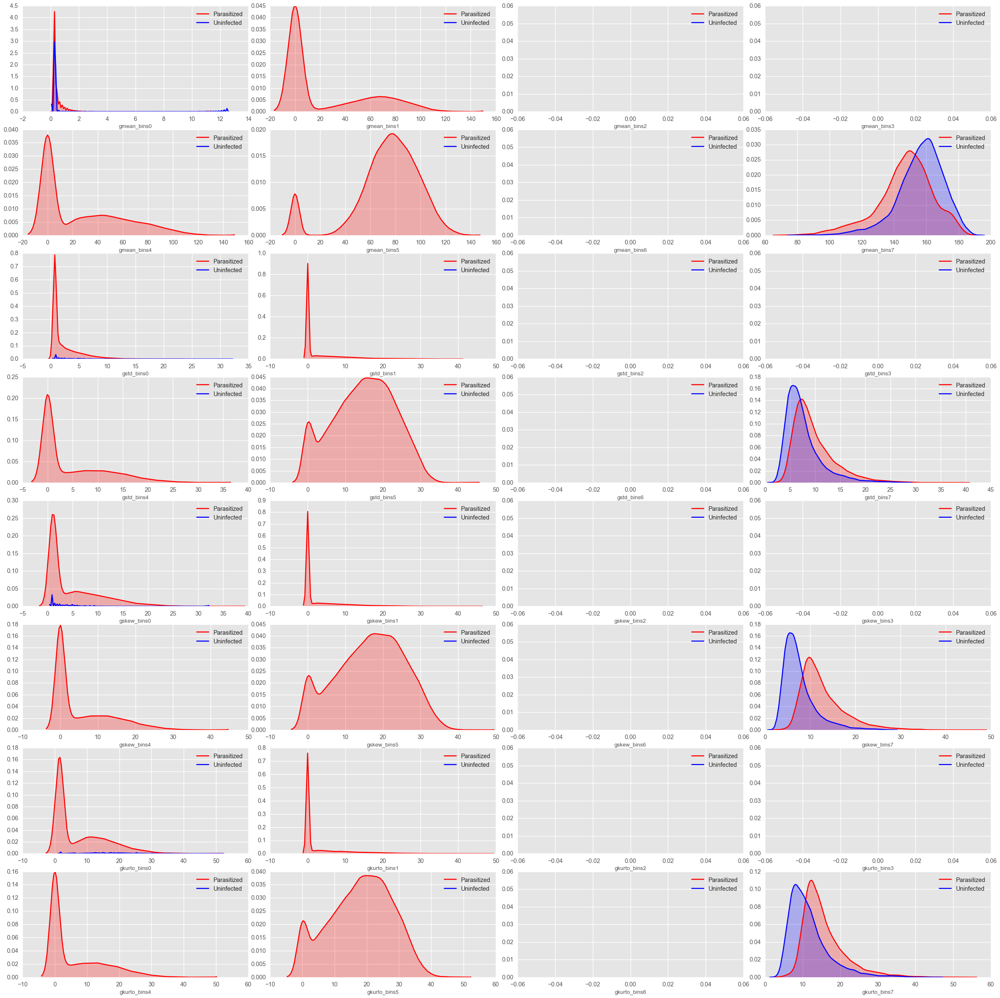

In [70]:
parasitized_df = g[g['class'] == 1]
uninfected_df = g[g['class'] == 0]

num_rows, num_cols = 5,2
rows = 8
cols = 4

fig, axes = plt.subplots(rows, cols, figsize=(30, 30))
fig.tight_layout()

for index, column in enumerate(g.columns):
    i,j = (index // cols, index % cols)
    g = sns.kdeplot(parasitized_df[column], color="Red", shade=True, ax=axes[i,j])
    g = sns.kdeplot(uninfected_df[column], ax=g, color="Blue", shade=True)
    g.set_xlabel(column)
    g = g.legend(["Parasitized","Uninfected"])

## Blue Channel:

In [71]:
b = pd.read_csv('csv/image_bins_stats_b.csv')
b.head()

,filename,bmean_bins0,bmean_bins1,bmean_bins2,bmean_bins3,bmean_bins4,bmean_bins5,bmean_bins6,bmean_bins7,bstd_bins0,...,bskew_bins7,bkurto_bins0,bkurto_bins1,bkurto_bins2,bkurto_bins3,bkurto_bins4,bkurto_bins5,bkurto_bins6,bkurto_bins7,class
0,clean_p_1.jpg,3.238728,163.416667,0.0,0.0,0.000000,177.137931,0.0,214.994616,16.049200,...,7.358843,47.621590,3.092351,0.0,0.0,0.000000,8.421707,0.0,9.181035,1
1,clean_p_2.jpg,1.294467,147.000000,0.0,0.0,0.000000,167.900000,0.0,207.965545,3.308282,...,8.430080,7.154429,0.840896,0.0,0.0,0.000000,15.029039,0.0,10.516990,1
2,clean_p_3.jpg,3.003968,161.500000,0.0,0.0,153.346154,177.946429,0.0,214.486325,14.322616,...,7.949709,43.394240,0.420448,0.0,0.0,7.701832,13.599319,0.0,10.354453,1
3,clean_p_4.jpg,1.093969,144.250000,0.0,0.0,0.000000,176.413333,0.0,209.827982,3.045115,...,8.987692,6.601182,2.619225,0.0,0.0,0.000000,12.787280,0.0,10.943418,1
4,clean_p_5.jpg,1.368313,0.000000,0.0,0.0,0.000000,0.000000,0.0,212.204533,3.343711,...,7.204324,6.869720,0.000000,0.0,0.0,0.000000,0.000000,0.0,8.924785,1


In [72]:
b.describe()

,bmean_bins0,bmean_bins1,bmean_bins2,bmean_bins3,bmean_bins4,bmean_bins5,bmean_bins6,bmean_bins7,bstd_bins0,bstd_bins1,...,bskew_bins7,bkurto_bins0,bkurto_bins1,bkurto_bins2,bkurto_bins3,bkurto_bins4,bkurto_bins5,bkurto_bins6,bkurto_bins7,class
count,23999.000000,23999.000000,23999.000000,23999.000000,23999.000000,23999.000000,23999.000000,23999.000000,24000.000000,24000.000000,...,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.00000
mean,1.263699,27.851208,1.075173,1.224896,33.878695,73.861132,7.753413,184.695473,4.058286,0.380028,...,8.086413,11.097250,0.477061,0.026225,0.010230,0.921958,4.774052,0.138764,11.013077,0.50000
std,1.191895,57.819199,10.934618,12.865772,57.639083,77.708889,31.617113,18.874134,4.610171,1.046965,...,3.314650,13.340580,1.322933,0.487321,0.220521,2.125254,5.577433,0.898937,3.796520,0.50001
min,0.081482,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,110.167601,0.437399,0.000000,...,1.641478,1.164208,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.194781,0.00000
25%,0.364856,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,170.797525,0.967150,0.000000,...,5.672750,1.831014,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.520694,0.00000
50%,1.185762,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,186.118449,3.119347,0.000000,...,7.472217,6.464977,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10.174275,0.50000
75%,1.687707,0.000000,0.000000,0.000000,101.872308,154.436667,0.000000,200.707226,4.168649,0.000000,...,9.575869,9.586776,0.000000,0.000000,0.000000,0.000000,9.772633,0.000000,12.626519,1.00000
max,26.934879,179.818182,150.000000,184.000000,171.000000,203.907801,180.666667,232.740543,51.575107,15.727568,...,33.543546,84.033683,18.370593,19.976124,12.118610,21.444822,36.168959,17.458315,40.435589,1.00000


In [73]:
b.describe().loc['mean']

bmean_bins0       1.263699
bmean_bins1      27.851208
bmean_bins2       1.075173
bmean_bins3       1.224896
bmean_bins4      33.878695
bmean_bins5      73.861132
bmean_bins6       7.753413
bmean_bins7     184.695473
bstd_bins0        4.058286
bstd_bins1        0.380028
bstd_bins2        0.021279
bstd_bins3        0.008201
bstd_bins4        0.723434
bstd_bins5        3.787426
bstd_bins6        0.111370
bstd_bins7        6.986998
bskew_bins0       6.968812
bskew_bins1       0.433819
bskew_bins2       0.023889
bskew_bins3       0.008969
bskew_bins4       0.831615
bskew_bins5       4.316466
bskew_bins6       0.124727
bskew_bins7       8.086413
bkurto_bins0     11.097250
bkurto_bins1      0.477061
bkurto_bins2      0.026225
bkurto_bins3      0.010230
bkurto_bins4      0.921958
bkurto_bins5      4.774052
bkurto_bins6      0.138764
bkurto_bins7     11.013077
class             0.500000
Name: mean, dtype: float64

In [75]:
b.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24000 entries, 0 to 23999
Data columns (total 34 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   filename      23999 non-null  object 
 1   bmean_bins0   23999 non-null  float64
 2   bmean_bins1   23999 non-null  float64
 3   bmean_bins2   23999 non-null  float64
 4   bmean_bins3   23999 non-null  float64
 5   bmean_bins4   23999 non-null  float64
 6   bmean_bins5   23999 non-null  float64
 7   bmean_bins6   23999 non-null  float64
 8   bmean_bins7   23999 non-null  float64
 9   bstd_bins0    24000 non-null  float64
 10  bstd_bins1    24000 non-null  float64
 11  bstd_bins2    24000 non-null  float64
 12  bstd_bins3    24000 non-null  float64
 13  bstd_bins4    24000 non-null  float64
 14  bstd_bins5    24000 non-null  float64
 15  bstd_bins6    24000 non-null  float64
 16  bstd_bins7    24000 non-null  float64
 17  bskew_bins0   24000 non-null  float64
 18  bskew_bins1   24000 non-nu

In [76]:
b.isnull().sum()

filename        1
bmean_bins0     1
bmean_bins1     1
bmean_bins2     1
bmean_bins3     1
bmean_bins4     1
bmean_bins5     1
bmean_bins6     1
bmean_bins7     1
bstd_bins0      0
bstd_bins1      0
bstd_bins2      0
bstd_bins3      0
bstd_bins4      0
bstd_bins5      0
bstd_bins6      0
bstd_bins7      0
bskew_bins0     0
bskew_bins1     0
bskew_bins2     0
bskew_bins3     0
bskew_bins4     0
bskew_bins5     0
bskew_bins6     0
bskew_bins7     0
bkurto_bins0    0
bkurto_bins1    0
bkurto_bins2    0
bkurto_bins3    0
bkurto_bins4    0
bkurto_bins5    0
bkurto_bins6    0
bkurto_bins7    0
class           0
dtype: int64

In [78]:
b = b.drop(['filename'], axis=1)
b.head()

,bmean_bins0,bmean_bins1,bmean_bins2,bmean_bins3,bmean_bins4,bmean_bins5,bmean_bins6,bmean_bins7,bstd_bins0,bstd_bins1,...,bskew_bins7,bkurto_bins0,bkurto_bins1,bkurto_bins2,bkurto_bins3,bkurto_bins4,bkurto_bins5,bkurto_bins6,bkurto_bins7,class
0,3.238728,163.416667,0.0,0.0,0.000000,177.137931,0.0,214.994616,16.049200,2.289502,...,7.358843,47.621590,3.092351,0.0,0.0,0.000000,8.421707,0.0,9.181035,1
1,1.294467,147.000000,0.0,0.0,0.000000,167.900000,0.0,207.965545,3.308282,0.707107,...,8.430080,7.154429,0.840896,0.0,0.0,0.000000,15.029039,0.0,10.516990,1
2,3.003968,161.500000,0.0,0.0,153.346154,177.946429,0.0,214.486325,14.322616,0.353553,...,7.949709,43.394240,0.420448,0.0,0.0,7.701832,13.599319,0.0,10.354453,1
3,1.093969,144.250000,0.0,0.0,0.000000,176.413333,0.0,209.827982,3.045115,2.077074,...,8.987692,6.601182,2.619225,0.0,0.0,0.000000,12.787280,0.0,10.943418,1
4,1.368313,0.000000,0.0,0.0,0.000000,0.000000,0.0,212.204533,3.343711,0.000000,...,7.204324,6.869720,0.000000,0.0,0.0,0.000000,0.000000,0.0,8.924785,1


In [79]:
import numpy as np
def clean_dataset(df):
    assert isinstance(df, pd.DataFrame), "df needs to be a pd.DataFrame"
    df.dropna(inplace=True)
    indices_to_keep = ~df.isin([np.nan, np.inf, -np.inf]).any(1)
    return df[indices_to_keep].astype(np.float64)

clean_dataset(data)

,rmean_bins0,rmean_bins1,rmean_bins2,rmean_bins3,rmean_bins4,rmean_bins5,rmean_bins6,rmean_bins7,rstd_bins0,rstd_bins1,...,bskew_bins7,bkurto_bins0,bkurto_bins1,bkurto_bins2,bkurto_bins3,bkurto_bins4,bkurto_bins5,bkurto_bins6,bkurto_bins7,class
0,1.485688,116.416667,0.0,0.0,0.000000,128.758621,0.000000,159.770015,11.472993,1.943118,...,7.358843,47.621590,3.092351,0.0,0.0,0.000000,8.421707,0.000000,9.181035,1.0
1,0.191129,91.000000,0.0,0.0,0.000000,122.485714,0.000000,149.839854,0.626280,0.000000,...,8.430080,7.154429,0.840896,0.0,0.0,0.000000,15.029039,0.000000,10.516990,1.0
2,1.218065,115.000000,0.0,0.0,121.730769,135.517857,0.000000,154.189458,10.132966,0.000000,...,7.949709,43.394240,0.420448,0.0,0.0,7.701832,13.599319,0.000000,10.354453,1.0
3,0.148524,98.000000,0.0,0.0,0.000000,129.906667,0.000000,157.583812,0.573290,2.000000,...,8.987692,6.601182,2.619225,0.0,0.0,0.000000,12.787280,0.000000,10.943418,1.0
4,0.183128,0.000000,0.0,0.0,0.000000,0.000000,0.000000,158.600042,0.602004,0.000000,...,7.204324,6.869720,0.000000,0.0,0.0,0.000000,0.000000,0.000000,8.924785,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23994,0.167535,0.000000,0.0,0.0,0.000000,0.000000,0.000000,145.580835,0.587364,0.000000,...,6.817875,7.277478,0.000000,0.0,0.0,0.000000,0.000000,0.000000,11.111529,0.0
23995,0.182460,0.000000,0.0,0.0,0.000000,0.000000,0.000000,142.290042,0.590877,0.000000,...,5.262551,8.170191,0.000000,0.0,0.0,0.000000,0.000000,0.000000,10.111068,0.0
23996,0.222222,0.000000,0.0,0.0,0.000000,0.000000,0.000000,145.978772,0.689536,0.000000,...,5.407731,7.859719,0.000000,0.0,0.0,0.000000,0.000000,0.000000,9.734824,0.0
23997,0.217425,0.000000,0.0,0.0,0.000000,0.000000,0.000000,145.915418,0.665380,0.000000,...,5.073114,7.887594,0.000000,0.0,0.0,0.000000,0.000000,0.000000,9.672132,0.0


In [80]:
b.isnull().sum()

bmean_bins0     0
bmean_bins1     0
bmean_bins2     0
bmean_bins3     0
bmean_bins4     0
bmean_bins5     0
bmean_bins6     0
bmean_bins7     0
bstd_bins0      0
bstd_bins1      0
bstd_bins2      0
bstd_bins3      0
bstd_bins4      0
bstd_bins5      0
bstd_bins6      0
bstd_bins7      0
bskew_bins0     0
bskew_bins1     0
bskew_bins2     0
bskew_bins3     0
bskew_bins4     0
bskew_bins5     0
bskew_bins6     0
bskew_bins7     0
bkurto_bins0    0
bkurto_bins1    0
bkurto_bins2    0
bkurto_bins3    0
bkurto_bins4    0
bkurto_bins5    0
bkurto_bins6    0
bkurto_bins7    0
class           0
dtype: int64

In [82]:
b.duplicated().sum()

0

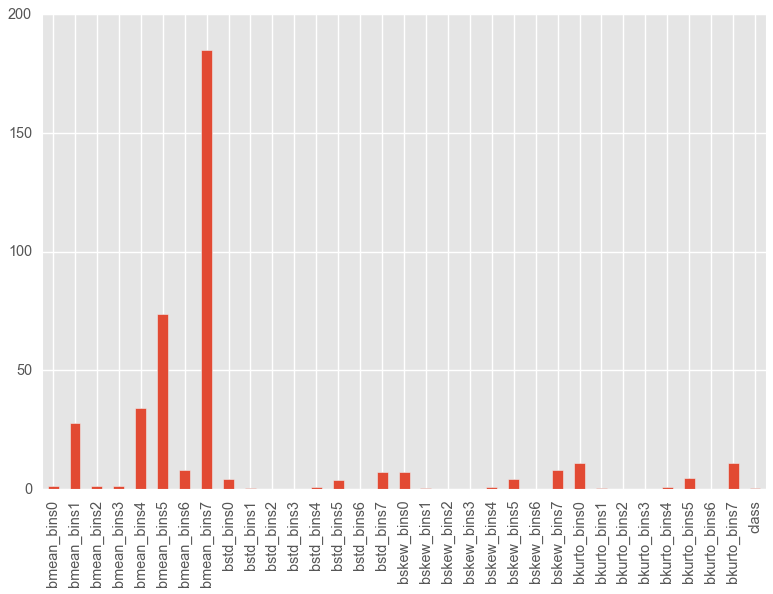

In [84]:
b.describe().loc['mean'].plot.bar()

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


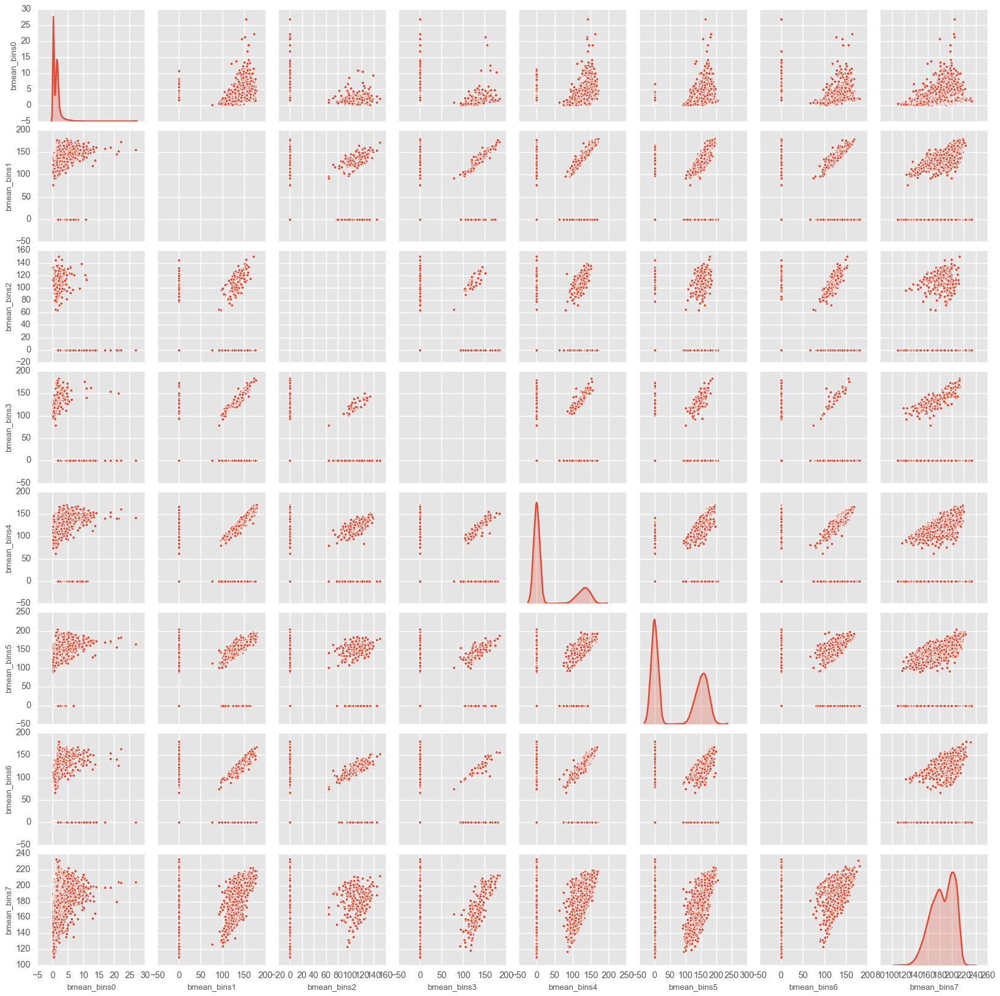

In [85]:
sns.pairplot(b.iloc[:, np.hstack(([0], range(1, 8)))], diag_kind='kde')

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


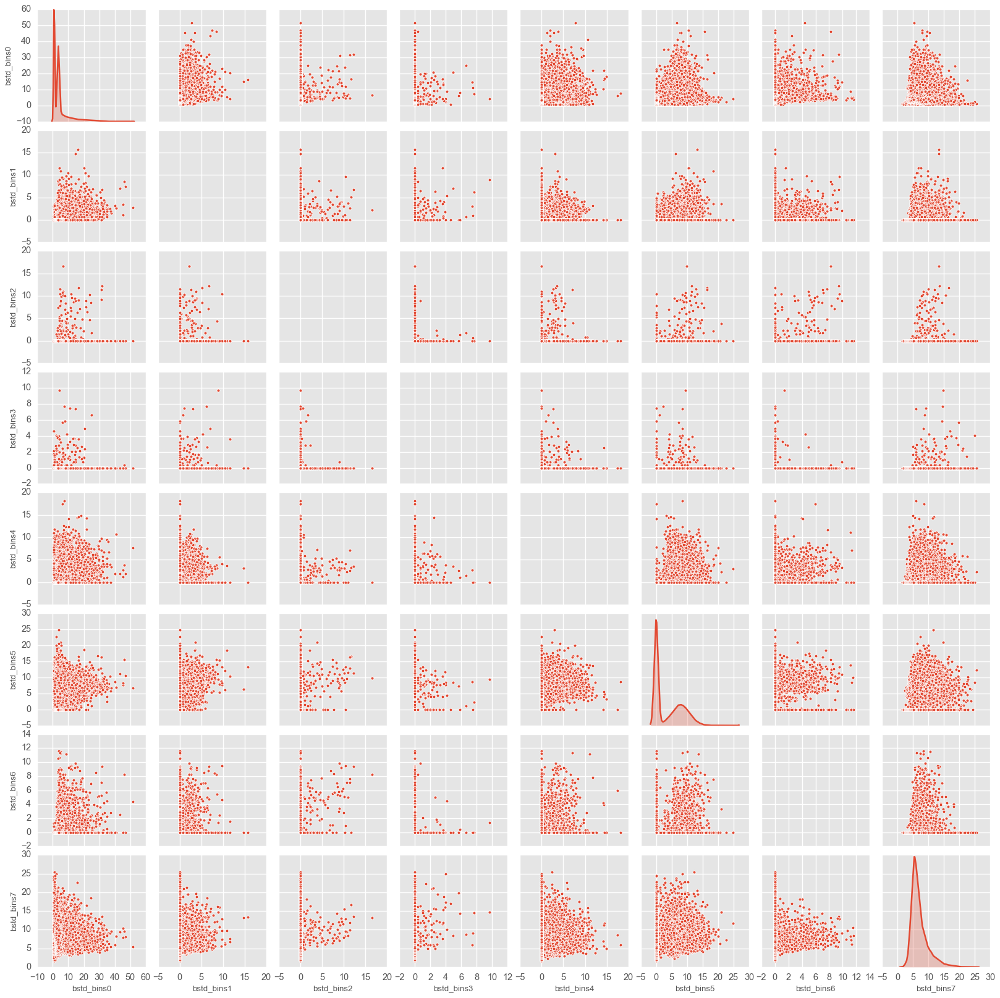

In [86]:
sns.pairplot(b.iloc[:, np.hstack((range(8, 16)))], diag_kind='kde')

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


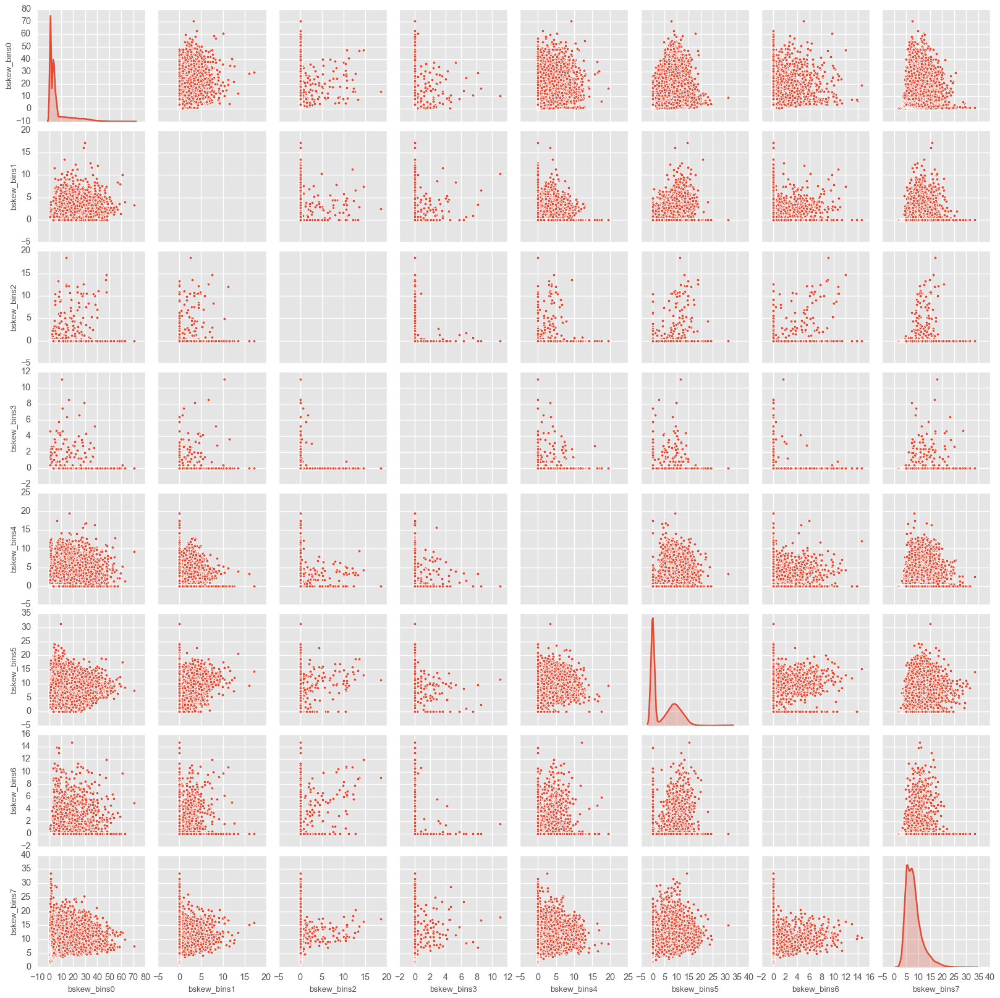

In [88]:
sns.pairplot(b.iloc[:, np.hstack((range(16, 24)))], diag_kind='kde')

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


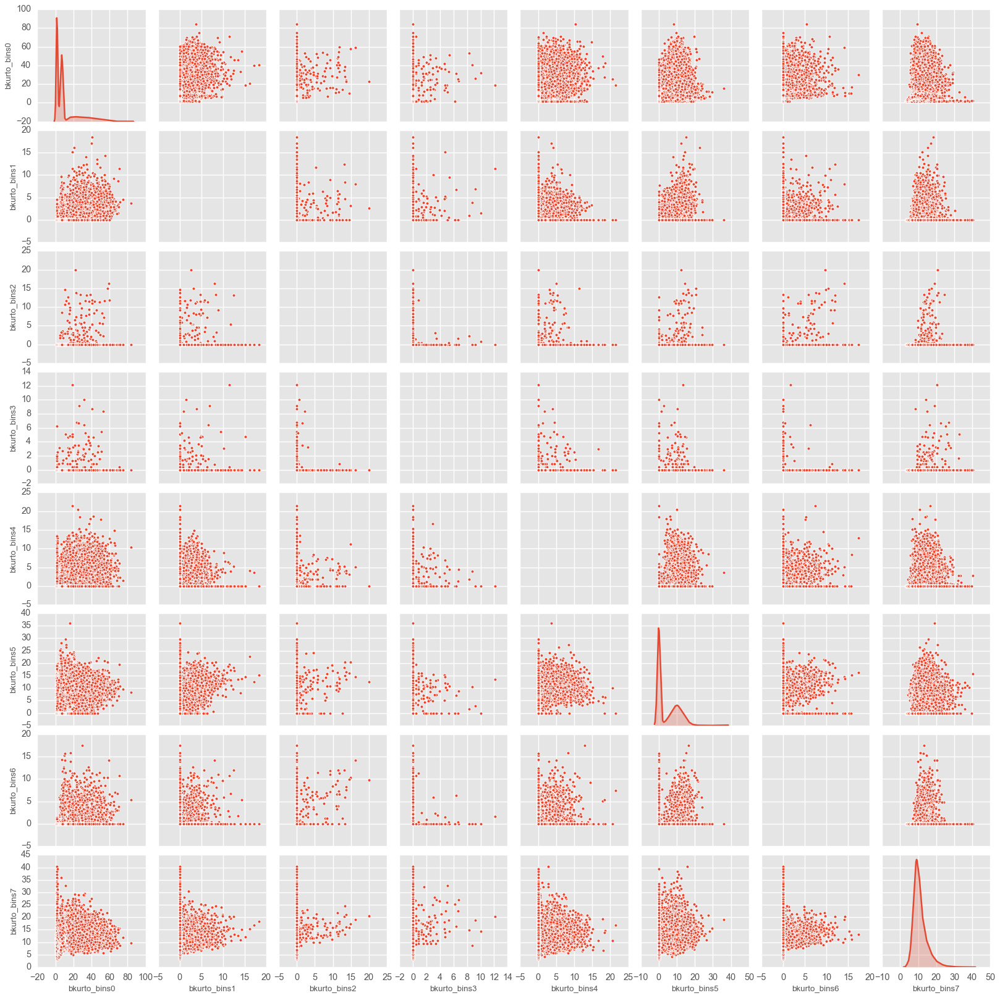

In [89]:
sns.pairplot(b.iloc[:, np.hstack((range(24, 32)))], diag_kind='kde')

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Defa

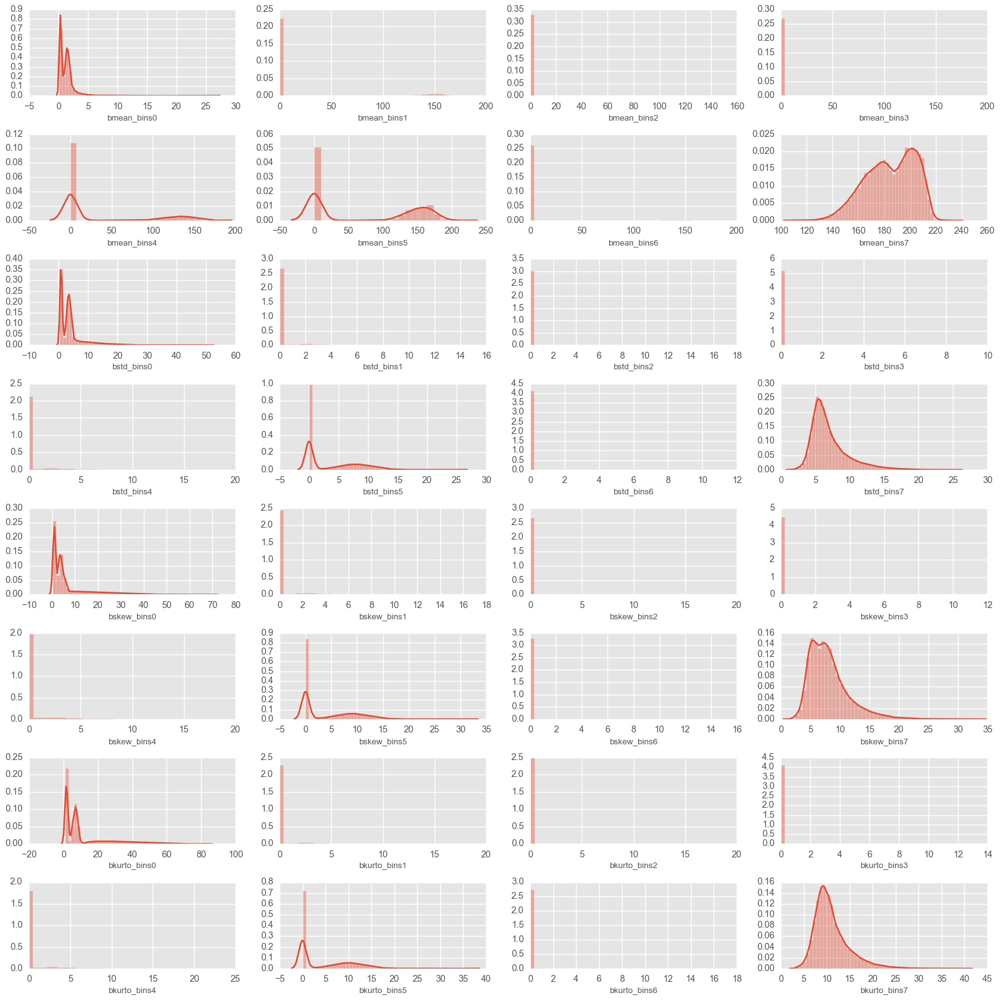

In [91]:
rows = 8
cols = 4

fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize= (20, 20))
col = b.columns
index = 0

for i in range(rows):
    for j in range(cols):
        sns.distplot(b[col[index]], ax = ax[i][j])
        index += 1

plt.tight_layout()

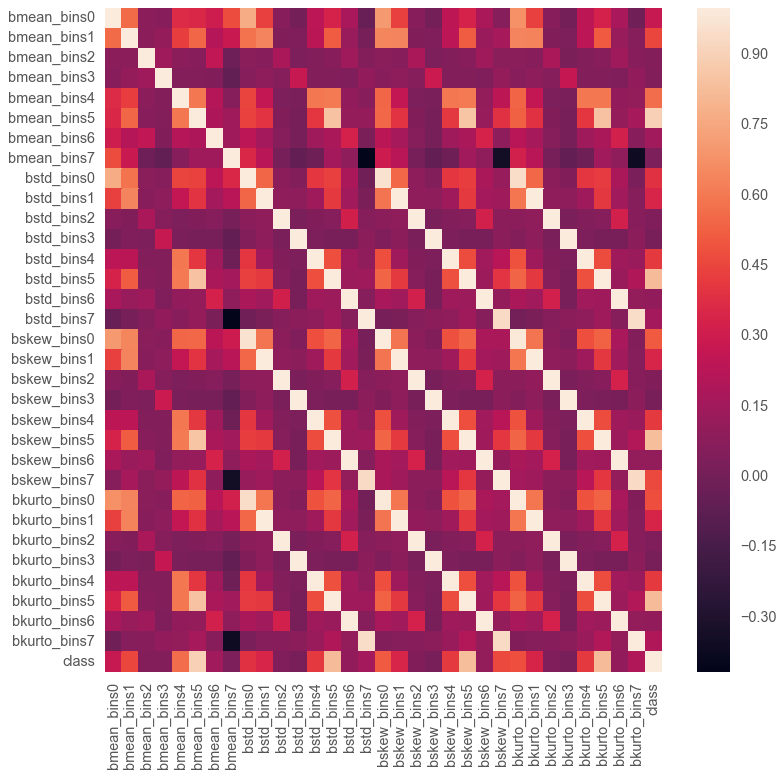

In [92]:
corrmat = b.corr()
fig, ax = plt.subplots(figsize = (10,10))
sns.heatmap(corrmat)

In [93]:
corr_df = getCorrelatedFeatures(corrmat['class'], 0.5)

In [94]:
corr_df

,Correlation Values
bmean_bins4,0.565035
bmean_bins5,0.896766
bstd_bins5,0.825123
bskew_bins0,0.509535
bskew_bins5,0.829717
bkurto_bins5,0.825183
class,1.000000


In [95]:
correlated_data = b[corr_df.index]
correlated_data

,bmean_bins4,bmean_bins5,bstd_bins5,bskew_bins0,bskew_bins5,bkurto_bins5,class
0,0.000000,177.137931,7.165589,32.843447,7.871852,8.421707,1
1,0.000000,167.900000,11.991367,5.277079,13.636860,15.029039,1
2,153.346154,177.946429,9.913628,29.440846,11.919441,13.599319,1
3,0.000000,176.413333,9.200093,4.902997,11.037378,12.787280,1
4,0.000000,0.000000,0.000000,5.179433,0.000000,0.000000,1
...,...,...,...,...,...,...,...
23994,0.000000,0.000000,0.000000,3.419981,0.000000,0.000000,0
23995,0.000000,0.000000,0.000000,3.820777,0.000000,0.000000,0
23996,0.000000,0.000000,0.000000,3.785639,0.000000,0.000000,0
23997,0.000000,0.000000,0.000000,3.741288,0.000000,0.000000,0


C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


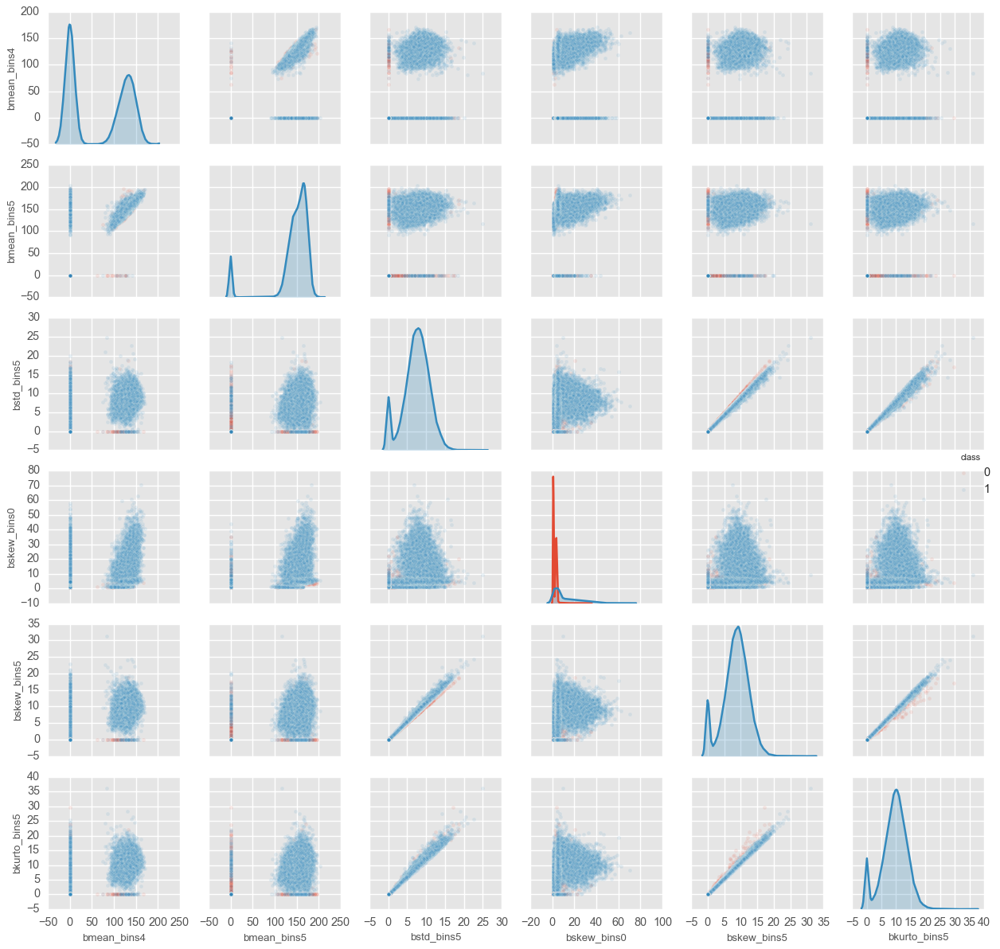

In [96]:
sns.pairplot(correlated_data, hue='class', plot_kws={'alpha':0.1})
plt.tight_layout()

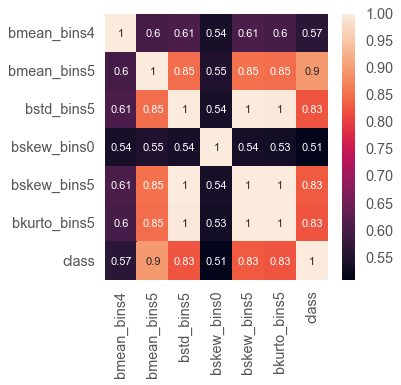

In [97]:
fig, ax = plt.subplots(figsize = (4,4))
sns.heatmap(correlated_data.corr(), annot=True)

In [107]:
corrmat = corrmat.abs().unstack() # absolute value of corr coef
corrmat = corrmat.sort_values(ascending=False)
corrmat = corrmat[corrmat >= 0.5]
corrmat = corrmat[corrmat < 1]
corrmat = pd.DataFrame(corrmat).reset_index()
corrmat.columns = ['feature1', 'feature2', 'correlation values']
corrmat.head()

,feature1,feature2,correlation values
0,bkurto_bins1,bskew_bins1,0.998966
1,bskew_bins1,bkurto_bins1,0.998966
2,bkurto_bins4,bskew_bins4,0.998940
3,bskew_bins4,bkurto_bins4,0.998940
4,bstd_bins2,bskew_bins2,0.998842


In [108]:
# find groups of correlated features

grouped_feature_ls = []
correlated_groups = []

for feature in corrmat.feature1.unique():
    
    if feature not in grouped_feature_ls:

        # find all features correlated to a single feature
        correlated_block = corrmat[corrmat.feature1 == feature]
        grouped_feature_ls = grouped_feature_ls + list(
            correlated_block.feature2.unique()) + [feature]

        # append the block of features to the list
        correlated_groups.append(correlated_block)

print('found {} correlated groups'.format(len(correlated_groups)))

found 8 correlated groups


In [109]:
for group in correlated_groups:
    print(group)
    print()

         feature1      feature2  correlation values
0    bkurto_bins1   bskew_bins1            0.998966
31   bkurto_bins1    bstd_bins1            0.996214
76   bkurto_bins1   bmean_bins1            0.634074
97   bkurto_bins1  bkurto_bins0            0.594294
103  bkurto_bins1   bskew_bins0            0.586055
115  bkurto_bins1    bstd_bins0            0.546708

        feature1     feature2  correlation values
2   bkurto_bins4  bskew_bins4            0.998940
28  bkurto_bins4   bstd_bins4            0.996273
89  bkurto_bins4  bmean_bins4            0.597425

      feature1      feature2  correlation values
4   bstd_bins2   bskew_bins2            0.998842
18  bstd_bins2  bkurto_bins2            0.997833

        feature1      feature2  correlation values
6    bskew_bins5  bkurto_bins5            0.998823
8    bskew_bins5    bstd_bins5            0.998734
50   bskew_bins5   bmean_bins5            0.854304
56   bskew_bins5         class            0.829717
80   bskew_bins5   bmean_bins4 